Copyright 2025 Joe Worsham

In [1]:
# obligatory reload content dynamically
%load_ext autoreload
%autoreload 2

In [2]:
from example_systems.pendulum.pendulum_system import PendulumSystem

In [3]:
import tensorflow_dynamics as tfd

In [ ]:
import gc
import itertools
import math
import numpy as np
import tensorflow as tf
import time

In [5]:
from IPython.display import display, Markdown
from matplotlib import pyplot as plt

# Define the Experiment Loop

In [6]:
system = PendulumSystem("p1")

In [7]:
t_0 = tf.zeros([1,], dtype=tf.float64)
t_f = tf.ones([1,], dtype=tf.float64) * 2.
time_range = tf.linspace(t_0, t_f, 65)
tfd_time_range = tf.transpose(time_range, [1, 0])

In [8]:
def generate_training_data(traj_count, solver, solver_args):
    if solver_args is None:
        solver_args = dict(rtol=1e-3, atol=1e-3)
    # generate the training data with a true dynamics simulation
    batch_x_0 = tf.random.uniform([traj_count, 2], [-20, -20], [20, 20], dtype=tf.float64)
    p = tf.tile(tf.constant([9.81, 0.01, 0.4, 0.5, 0.03], dtype=tf.float64)[None, :], (traj_count, 1))
    ode_model = lambda t, x: system(x, None, p, t)
    batch_x, tt_rk4 = tfd.de.odeint(ode_model, batch_x_0, tfd_time_range, method=solver, **solver_args)
    return batch_x, tt_rk4

In [9]:
def sample_true_dynamics(batch_x):
    # generate flow field coordinates
    magnitude_theta = tf.reduce_max(tf.abs(batch_x[..., 0]))
    magnitude_omega = tf.reduce_max(tf.abs(batch_x[..., 1]))
    theta = np.linspace(-magnitude_theta, magnitude_theta, 20)
    omega = np.linspace(-magnitude_omega, magnitude_omega, 20)
    X, Y = np.meshgrid(theta, omega)
    big_coords = tf.concat([tf.stack([[X[x, y], Y[x, y]] for y in range(20)], axis=0) for x in range(20)], axis=0)
    big_coords = tf.cast(big_coords, tf.float64)
    
    # sample true dynamics flow field
    p_2 = tf.tile(tf.constant([9.81, 0.01, 0.4, 0.5, 0.03], dtype=tf.float64)[None, :], (big_coords.shape[0], 1))
    ode_model_2 = lambda t, x: system(x, None, p_2, t)
    big_dx_dt = ode_model_2(None, big_coords)
    return big_coords, big_dx_dt

In [10]:
def plot_flow_field(big_coords, big_dx_dt, batch_x):
    # plot the true flow field and the training dataset
    fig, true_ax = plt.subplots(1, 1, figsize=(4, 4))
    true_ax.quiver(big_coords[:, 0], big_coords[:, 1], big_dx_dt[:, 0], big_dx_dt[:, 1], color="xkcd:sky blue")
    for traj in batch_x:
        true_ax.plot(traj[:, 0], traj[:, 1], '--', color="gray", linewidth="0.1")
    true_ax.set_xlabel(r"$\theta$ (rad)")
    true_ax.set_ylabel(r"$\omega$ (rad/s)")
    true_ax.set_title("True Pendulum Dynamics")
    plt.show()

In [11]:
def plot_learned_flow_field(dxdt, big_coords):
    pred_dx_dt = dxdt(big_coords)
    fig, pred_ax = plt.subplots(1, 1, figsize=(4, 4))
    pred_ax.quiver(big_coords[:, 0], big_coords[:, 1], pred_dx_dt[:, 0], pred_dx_dt[:, 1], color="xkcd:light red")
    pred_ax.set_xlabel(r"$\theta$ (rad)")
    pred_ax.set_ylabel(r"$\omega$ (rad/s)")
    pred_ax.set_title("Learned Pendulum Dynamics")
    plt.show()

In [12]:
def experiment(dxdt, terminal_loss, continuous_loss, eval_loss, encoder, decoder,
               epochs=300, lr=1e-3, traj_count=1000, eval_traj_count=200, solver="dopri5", solver_args=None,
               batch_size=1000, adjoint=True, plot_rate=30):
    solver_args = solver_args or dict(rtol=1e-3, atol=1e-3)
    encoder = encoder or tf.identity
    decoder = decoder or tf.identity
        
    # generate the training data to train on and plot the flow field
    batch_x, tt_rk4 = generate_training_data(traj_count+eval_traj_count, solver, solver_args)
    eval_batch_x = batch_x[-eval_traj_count:, ...]
    eval_tt_rk4 = tt_rk4[-eval_traj_count:, ...]
    batch_x = batch_x[:eval_traj_count, ...]
    tt_rk4 = tt_rk4[:eval_traj_count, ...]
    big_coords, big_dx_dt = sample_true_dynamics(batch_x)
    plot_flow_field(big_coords, big_dx_dt, batch_x)
    
    # build tensorflow training set and model
    dataset = tf.data.Dataset.from_tensor_slices(batch_x)
    dataset = dataset.shuffle(traj_count, reshuffle_each_iteration=True)
    dataset = dataset.batch(batch_size, drop_remainder=False)
    learning_ode_func = lambda t, x: dxdt(x)
    learning_solver = tfd.de.OdeintSolver(learning_ode_func,
                                          continuous_loss_func=continuous_loss,
                                          method=solver,
                                          options=solver_args,
                                          adjoint_options=solver_args)
    
    # plot learned flow field and traing
    # initial plot also naturally does the initial touch
    plot_learned_flow_field(dxdt, big_coords)
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    losses = []
    start_time_s = time.time()
    for epoch in range(epochs):
        epoch_avg_loss = []
        for batch in dataset:
            with tf.GradientTape() as tape:
                tape.watch(dxdt.trainable_variables)
                batch_in = encoder(batch[..., 0, :])
                if adjoint:
                    xt_hat, *_ = learning_solver.odeint_adjoint(batch_in, tfd_time_range)
                else:
                    xt_hat, *_ = learning_solver.odeint(batch_in, tfd_time_range)
                xt_hat = decoder(xt_hat)
                err = terminal_loss(xt_hat, batch)
            grads = tape.gradient(err, dxdt.trainable_variables)
            optimizer.apply_gradients(zip(grads, dxdt.trainable_variables))
            epoch_avg_loss.append(err)
        epoch_avg_loss = np.mean(epoch_avg_loss)
        losses.append(epoch_avg_loss)
        print(f"{epoch}: {epoch_avg_loss}")

        # plot the flow field at the end of the epoch
        if plot_rate > 0 and epoch % plot_rate == 0:
            plot_learned_flow_field(dxdt, big_coords)
    duration_s = time.time() - start_time_s
    print(f"Training finished. Took {duration_s:.3f} seconds.")
        
    # plot the training curve
    plt.plot(losses)
    plt.title("Losses")
    plt.xlabel("Epochs")
    
    # run a quick evaluation
    eval_avg_loss = []
    batch_in = encoder(eval_batch_x[..., 0, :])
    xt_hat, *_ = learning_solver.odeint(batch_in, tfd_time_range)
    xt_hat = decoder(xt_hat)
    err = eval_loss(xt_hat, eval_batch_x)
    eval_avg_loss = tf.reduce_mean(err)
    print(f"Eval loss: {eval_avg_loss:.2f}")
    
    # plot the final flow against the ground truth
    pred_dx_dt = dxdt(big_coords)
    fig, (true_ax, pred_ax) = plt.subplots(1, 2, figsize=(8, 4))
    true_ax.quiver(big_coords[:, 0], big_coords[:, 1], big_dx_dt[:, 0], big_dx_dt[:, 1], color="xkcd:sky blue")
    true_ax.set_xlabel(r"$\theta$ (rad)")
    true_ax.set_ylabel(r"$\omega$ (rad/s)")
    true_ax.set_title("True Pendulum Dynamics")
    pred_ax.quiver(big_coords[:, 0], big_coords[:, 1], pred_dx_dt[:, 0], pred_dx_dt[:, 1], color="xkcd:light red")
    pred_ax.set_xlabel(r"$\theta$ (rad)")
    pred_ax.set_ylabel(r"$\omega$ (rad/s)")
    pred_ax.set_title("Learned Pendulum Dynamics")
    plt.show()
    
    return duration_s, eval_avg_loss

# Experiments

## Experiment Library

In [13]:
def terminal_only_loss(y_hat, y):
    return tf.reduce_mean(
        tf.linalg.norm(y_hat[..., -1, :] - y[..., -1, :], axis=-1)
    )

In [14]:
def all_states_loss(y_hat, y):
    return tf.reduce_mean(tf.linalg.norm(y_hat - y))

In [15]:
def create_optimal_transport_loss(dxdt, lambda_1):
    def optimal_transport_loss(t, y):
        return lambda_1 * tf.linalg.norm(dxdt(y), axis=-1, keepdims=True)
    return optimal_transport_loss

In [16]:
def create_jac_norm_loss(dxdt, sample):
    def jac_norm_loss(t, y):
        with tf.GradientTape() as tape:
            dy = dxdt(t, y)[..., None]
        jac = tape.batch_jacobian(dy, y)
        return tf.norm(jac, 'fro')
    return jac_norm_loss

In [17]:
def feed_forward_model(activation='tanh', initializer=None, layers=None, out_dim=2):
    layers = layers or [16, 16]
    dense_layers = [tf.keras.layers.Dense(l, activation=activation, dtype=tf.float64,
                                          kernel_initializer=initializer) for l in layers]
    dense_layers += [tf.keras.layers.Dense(out_dim, dtype=tf.float64, kernel_initializer=initializer),]
    dxdt = tf.keras.Sequential(dense_layers)
    return dxdt

In [18]:
class RotationalEncoding1d(tf.keras.Model):
    def __init__(self, activation='tanh', initializer=None, layers=None):
        super().__init__(autocast=False)
        self._dxdt = feed_forward_model(activation, initializer, layers)
        
    def call(self, x):
        theta, omega = tf.unstack(x, axis=-1)
        theta_enc = tf.math.floormod(theta + 10*math.pi, 2*math.pi)
        x_enc = tf.stack([theta_enc, omega], axis=-1)
        return self._dxdt(x_enc)

In [19]:
class RotationalEncoding2d(tf.keras.Model):
    def __init__(self, activation='tanh', initializer=None, layers=None):
        super().__init__(autocast=False)
        self._dxdt = feed_forward_model(activation, initializer, layers)
        
    def call(self, x):
        theta, omega = tf.unstack(x, axis=-1)
        x_enc = tf.stack([tf.math.sin(theta), tf.math.cos(theta), omega], axis=-1)
        return self._dxdt(x_enc)

In [20]:
class RotationalEncoding1dOrder2(tf.keras.Model):
    def __init__(self, activation='tanh', initializer=None, layers=None):
        super().__init__(autocast=False)
        self._dxdt = feed_forward_model(activation, initializer, layers, out_dim=1)
        
    def call(self, x):
        theta, omega = tf.unstack(x, axis=-1)
        x_enc = tf.stack([tf.math.floormod(theta + 10*math.pi, 2*math.pi), omega], axis=-1)
        angular_acc = self._dxdt(x_enc)[..., 0]
        return tf.stack([omega, angular_acc], axis=-1)

In [21]:
class RotationalEncoding2dOrder2(tf.keras.Model):
    def __init__(self, activation='tanh', initializer=None, layers=None):
        super().__init__(autocast=False)
        self._dxdt = feed_forward_model(activation, initializer, layers, out_dim=1)
        
    def call(self, x):
        theta, omega = tf.unstack(x, axis=-1)
        x_enc = tf.stack([tf.math.sin(theta), tf.math.cos(theta), omega], axis=-1)
        angular_acc = self._dxdt(x_enc)[..., 0]
        return tf.stack([omega, angular_acc], axis=-1)

In [22]:
def create_model(name, activation='tanh', initializer=None, layers=None):
    if name == "node":
        return feed_forward_model(activation, initializer, layers)
    if name == "rotational_encoding_1d":
        return RotationalEncoding1d(activation, initializer, layers)
    if name == "rotational_encoding_2d":
        return RotationalEncoding2d(activation, initializer, layers)
    if name == "rotational_encoding_1d_order_2":
        return RotationalEncoding1dOrder2(activation, initializer, layers)
    if name == "rotational_encoding_2d_order_2":
        return RotationalEncoding2dOrder2(activation, initializer, layers)

In [23]:
xavier = tf.keras.initializers.GlorotUniform(seed=0)
xavier_norm = tf.keras.initializers.GlorotNormal(seed=0)
init_random = tf.keras.initializers.RandomUniform(seed=0)
init_random_norm = tf.keras.initializers.RandomNormal(seed=0)
init_constant_0_5 = tf.keras.initializers.Constant(value=0.5)
init_constant_1 = tf.keras.initializers.Constant(value=1.)

In [24]:
epochs = 200
solver = "rk4"
solver_args=dict(h=tf.cast(1./16., tf.float64))
adjoint=False
traj_count = 1000
eval_traj_count = 200

In [25]:
batch_sizes = [32, 64, 128]
activations = ("tanh", "relu")
initializers = {#"xavier": xavier,
                "xavier_norm": xavier_norm,
                #"init_random": init_random,
                #"init_random_norm": init_random_norm
}
losses = {#"terminal_only": terminal_only_loss,
          "all_states": all_states_loss
}
models = ["node",
          #"rotational_encoding_1d",
          "rotational_encoding_2d",
          #"rotational_encoding_1d_order_2",
          "rotational_encoding_2d_order_2"]
adjoints = [True, False]

# Big Grid Search


(32, 'tanh', 'xavier_norm', 'all_states', 'node', True)



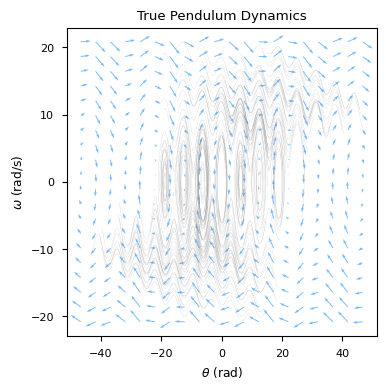

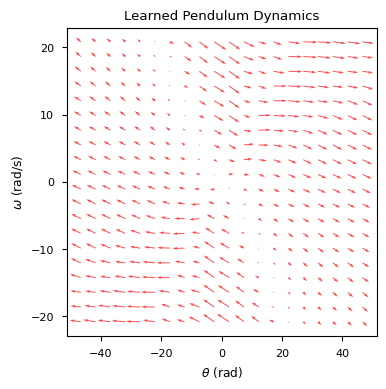

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
0: 457.93863558148405
1: 448.66133871526097
2: 438.19562329608283
3: 427.4491846688302
4: 414.77906417772584
5: 406.37196579564363
6: 398.65771366704695
7: 385.71947078206705
8: 379.6497820000678
9: 371.56059010760134
10: 361.3195669992139
11: 353.1897724844066
12: 349.0258442114142
13: 339.21073875854444
14: 331.8915163452958
15: 330.9228404969078
16: 323.59301979860436
17: 317.5593056648004
18: 308.7588612727764
19: 307.78160850732377
20: 303.37530154100705
21: 298.572337734517
22: 296.78360102443764
23: 292.22353526558527
24: 289.27497758907776
25: 285.12209661035837
26: 281.18191288003516
27: 277.29836786409356
28: 272.3529830620284
29: 272.30231942362167
30: 265.8155860839427
31: 264.0244310607813
32: 261.12409156670805
33: 259.926719704405
34: 256.4800277588017
35: 257.0525975541791

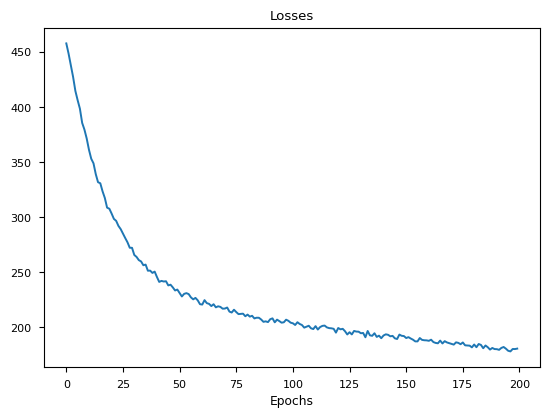

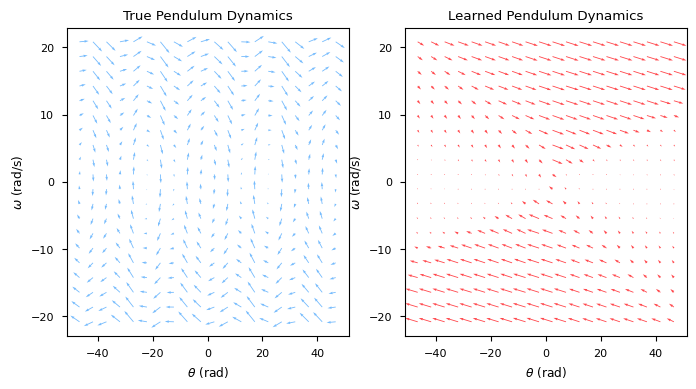


(32, 'tanh', 'xavier_norm', 'all_states', 'node', False)



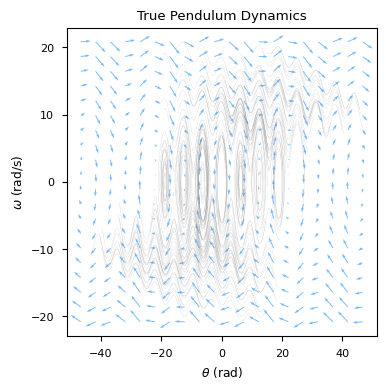

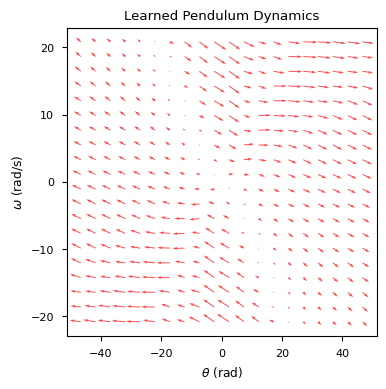

0: 457.91227294590624
1: 448.59436892391267
2: 438.13464965037826
3: 427.35528634994705
4: 414.62019060031463
5: 406.12683532667245
6: 398.3371167123468
7: 385.2678076343906
8: 379.0045970973287
9: 370.870576724492
10: 360.4491077863915
11: 352.0926179780477
12: 347.8523046179052
13: 337.8674367762157
14: 330.57483449877594
15: 329.33914232611335
16: 321.8821915662742
17: 315.7749663514341
18: 306.96809565788624
19: 305.71185464354727
20: 301.1733865752211
21: 296.5001704758532
22: 294.38892410829214
23: 289.68287243329075
24: 286.76192661386983
25: 282.47589843658625
26: 278.45771324438425
27: 274.504020974944
28: 269.6724650892731
29: 269.38459689977765
30: 262.7261142716514
31: 261.1228364449042
32: 257.98106203418064
33: 256.8567588028076
34: 253.12193381734073
35: 253.50491357095143
36: 248.18514484082752
37: 248.33682444927354
38: 246.0997968404034
39: 247.10191668261896
40: 242.36362925745416
41: 238.41030617563538
42: 239.05925556412856
43: 237.902115864925
44: 238.100813628158

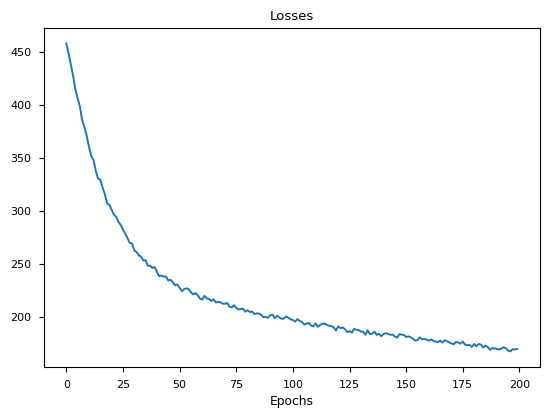

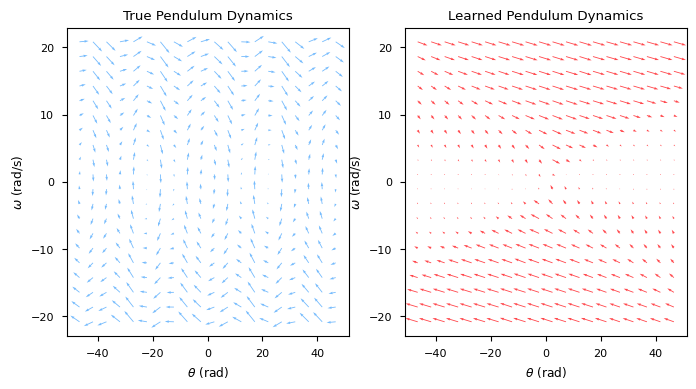


(32, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d', True)



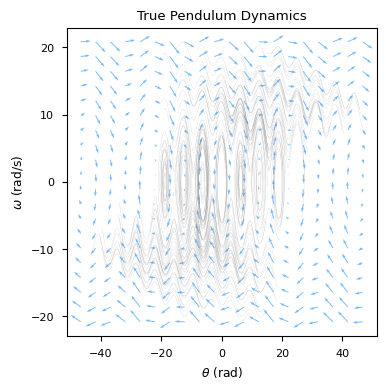

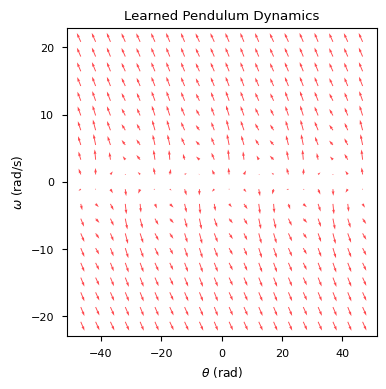

0: 507.5224072410662
1: 495.65074925831055
2: 481.4250819360124
3: 466.38420047120627
4: 449.7903626621824
5: 436.6933879282633
6: 424.94929799991377
7: 406.83482283273617
8: 396.0502598795946
9: 383.9099316313037
10: 370.50857921164726
11: 359.9697931412346
12: 354.7526171509752
13: 344.00028743326584
14: 336.66065561406975
15: 335.93356488976093
16: 329.09610861542194
17: 323.0852067122465
18: 314.88245216093026
19: 314.58795821284235
20: 310.2888456096684
21: 305.79117891301684
22: 304.4830290392168
23: 300.33780074640316
24: 297.69231585996005
25: 293.6968685423357
26: 289.71982178275863
27: 285.78340142344405
28: 281.74388065858363
29: 281.0779804990801
30: 274.83132678361335
31: 273.24264939173537
32: 269.82691682888526
33: 269.03920171583064
34: 265.57594851131694
35: 265.34232973321616
36: 260.322655312453
37: 260.4821680765634
38: 257.51379447821427
39: 258.05756478023045
40: 252.37521526739897
41: 248.34848869109575
42: 248.67766672632905
43: 247.42323872120966
44: 247.142171

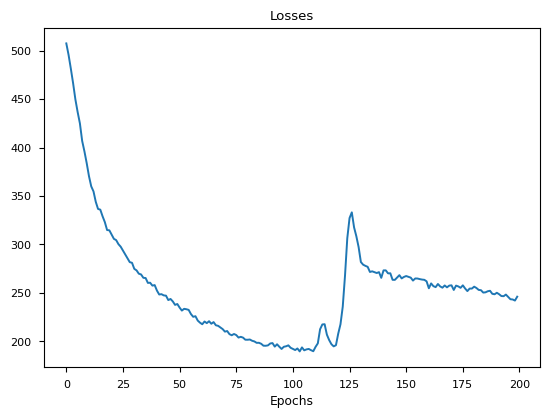

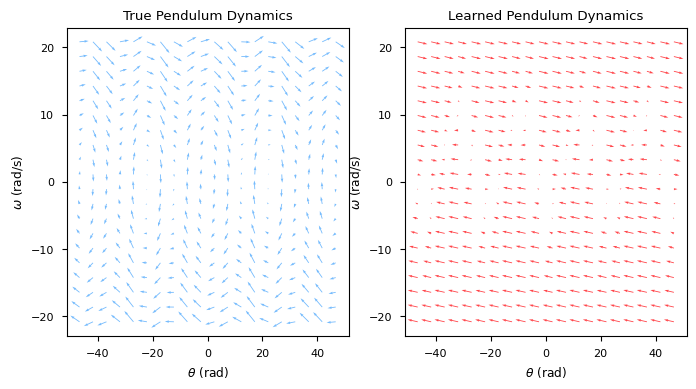


(32, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d', False)



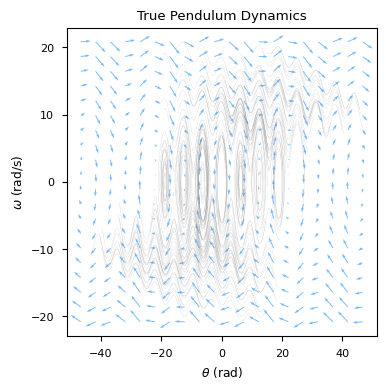

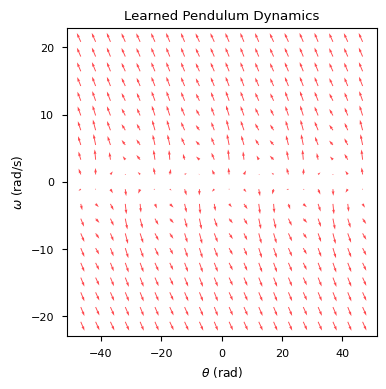

0: 507.4894679662448
1: 495.604876289924
2: 481.3908643690499
3: 466.30493428959284
4: 449.6186547807838
5: 436.4249796259022
6: 424.543567112466
7: 406.3346407444366
8: 395.36709979404714
9: 383.0944228231687
10: 369.5135764667451
11: 358.72234702917285
12: 353.34785072013455
13: 342.377312436625
14: 334.92807191234454
15: 333.9862812793621
16: 327.02218289713454
17: 320.9388014659564
18: 312.5762921623054
19: 312.38758216469193
20: 308.0800486491084
21: 303.628908581108
22: 302.44412019223995
23: 298.30824451321183
24: 295.8767812514919
25: 291.96222886950136
26: 288.15187388513027
27: 284.24886975463056
28: 280.43479629365265
29: 279.68476903962085
30: 273.21555853622874
31: 272.3278833337072
32: 268.6383408206026
33: 267.7576872404889
34: 264.4020446179653
35: 263.7208508205114
36: 258.9394159443842
37: 258.5800918389563
38: 256.175654802764
39: 256.2724449740404
40: 250.57062077121344
41: 247.21135419778676
42: 246.89640402856767
43: 245.38297884815697
44: 244.51401150392243
45: 2

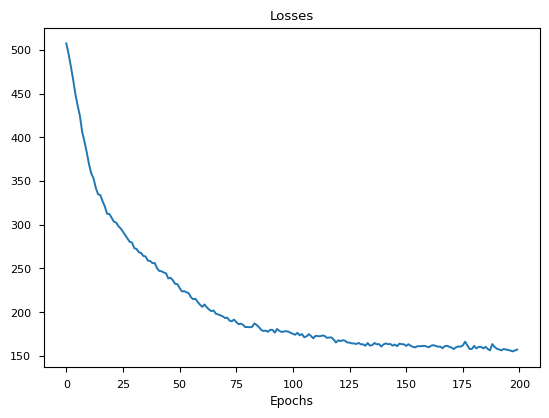

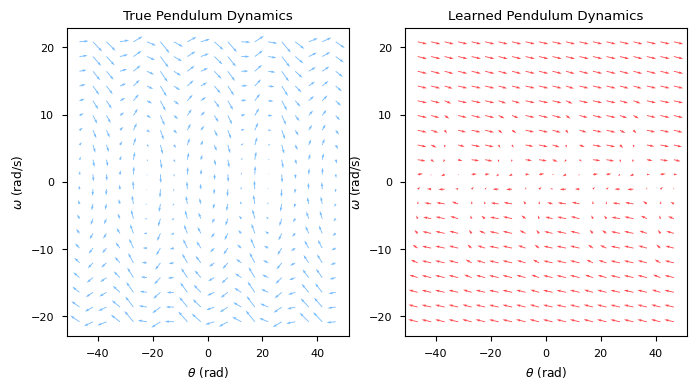


(32, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', True)



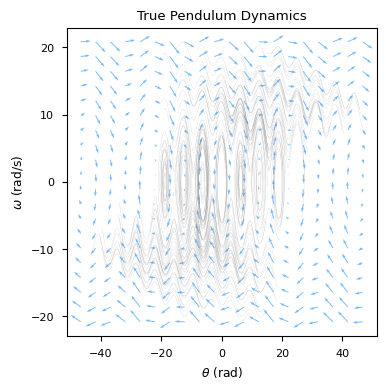

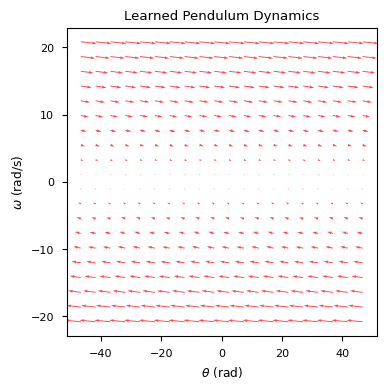

0: 195.02006548013455
1: 186.10682294414778
2: 178.42838605833464
3: 171.9914299360616
4: 169.84920218939095
5: 168.20996290277407
6: 165.47558788047564
7: 166.0776855391841
8: 167.27348395707924
9: 168.2562540891016
10: 163.9528246105715
11: 164.2309591834859
12: 164.6700354249844
13: 164.943083195104
14: 166.37432102059435
15: 162.4167867640849
16: 161.60963599431503
17: 166.05517261386737
18: 166.7345200973112
19: 162.02423308921328
20: 165.59567995331605
21: 167.4103390779741
22: 164.6227315221779
23: 165.51754674347393
24: 166.564507409957
25: 165.35506698906985
26: 165.4558691403863
27: 165.94611210085674
28: 163.08291270748137
29: 163.94383792552327
30: 163.67956470602257
31: 164.01988301380575
32: 163.10726977512846
33: 163.28111326251482
34: 162.13084732738758
35: 164.39109101192395
36: 161.41075683770575
37: 164.94622949615948
38: 163.61844429615826
39: 164.919342716197
40: 163.87930435155616
41: 160.3840420075841
42: 162.40048528109395
43: 162.6969483383168
44: 162.412593442

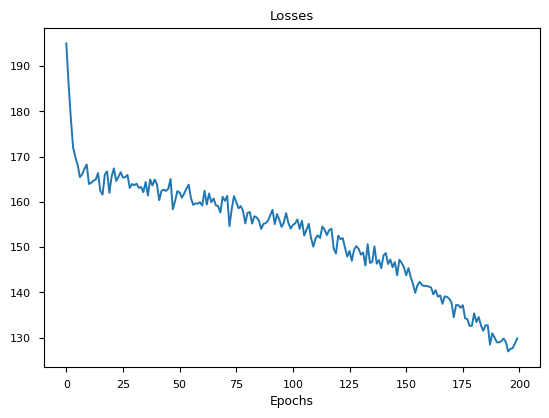

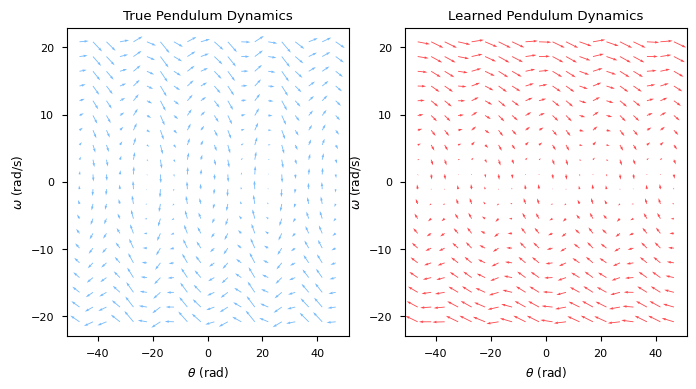


(32, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', False)



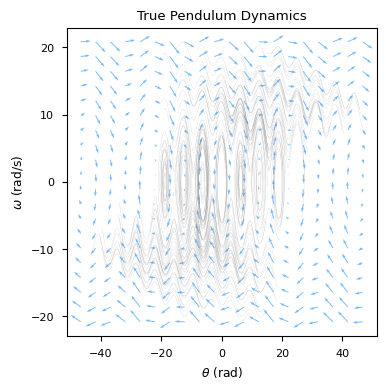

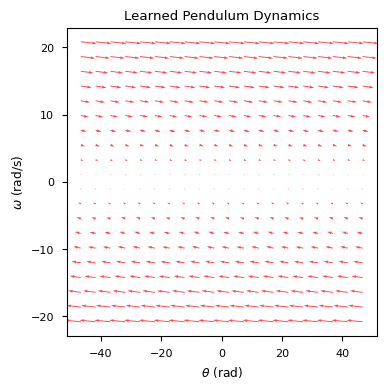

0: 194.97219979412847
1: 186.03197147749648
2: 178.28530154681062
3: 171.60591437339033
4: 169.17425796775166
5: 167.33580843445165
6: 164.3906065867512
7: 164.94138934797837
8: 166.11492520590235
9: 167.06925530575475
10: 162.8781008843893
11: 162.8449010828326
12: 163.32095672557125
13: 163.2616854783062
14: 164.69613393632457
15: 160.52562663008672
16: 160.63805138306225
17: 164.13224517127648
18: 164.86849868963182
19: 160.17461789946054
20: 163.67334896284436
21: 165.6190582328284
22: 163.01061464295117
23: 163.2562153517928
24: 164.61120778112044
25: 163.36737032078963
26: 163.17647862190657
27: 163.7137899424701
28: 160.7498226460929
29: 161.76045168796892
30: 160.95173995152487
31: 161.9576937732548
32: 160.60446438844045
33: 161.01084932275555
34: 159.6262316926937
35: 161.31126074294497
36: 158.63665566574196
37: 161.6510379406938
38: 160.58532940787012
39: 161.56386343119138
40: 160.59513179937858
41: 157.27890420414616
42: 158.86084414529768
43: 158.7827145608645
44: 158.16

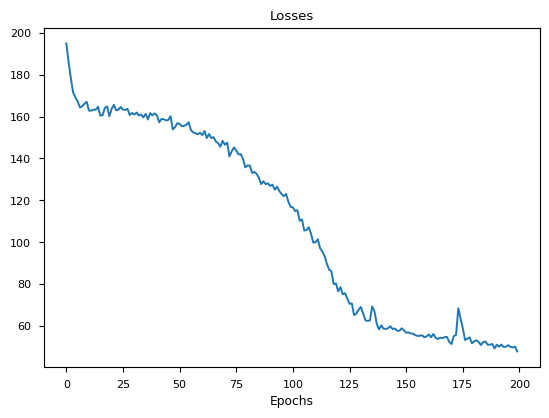

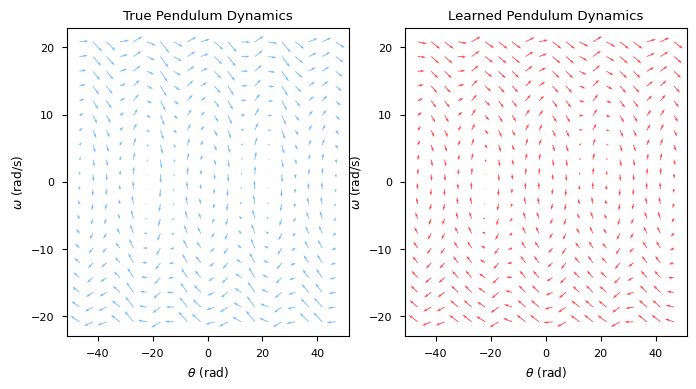


(32, 'relu', 'xavier_norm', 'all_states', 'node', True)



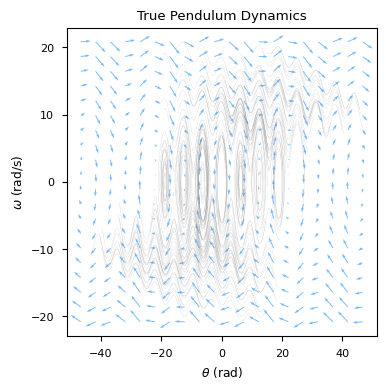

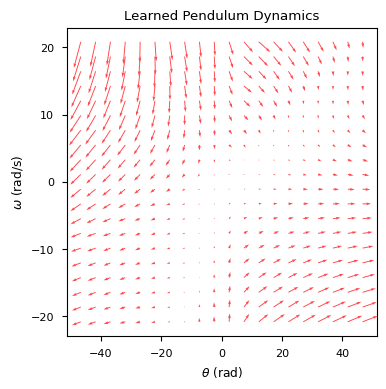

0: 471.96768796777286
1: 452.0602842316752
2: 430.4585262360255
3: 410.61457493327555
4: 388.3927953242538
5: 369.34655107742304
6: 350.99301129155134
7: 328.91541367771055
8: 309.1121690477598
9: 290.85685869804576
10: 268.0138392932894
11: 248.1247729728274
12: 231.9453776724177
13: 217.1110901926281
14: 206.62133621633316
15: 196.63314577791104
16: 187.88187875089463
17: 189.48862008772093
18: 187.1071156991679
19: 180.96101651957096
20: 182.90838903049843
21: 184.6515219171449
22: 181.17395283953883
23: 181.97458722002366
24: 181.52234718507836
25: 180.47453783773858
26: 181.29018490416553
27: 181.1642178594309
28: 178.1797988976653
29: 178.59537948766845
30: 178.4202927512603
31: 177.0856677266813
32: 177.71735952716918
33: 176.13814011657857
34: 176.70414658262823
35: 179.02296296460307
36: 174.64099284154943
37: 178.46730394033895
38: 177.33913723564564
39: 179.66801766478787
40: 176.93448124176163
41: 172.66431756272365
42: 175.3509121999645
43: 175.49438058579068
44: 175.61100

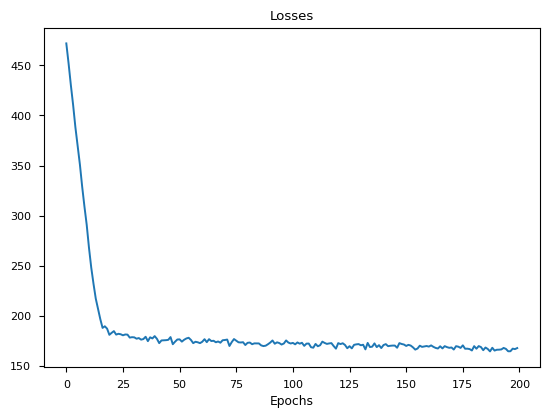

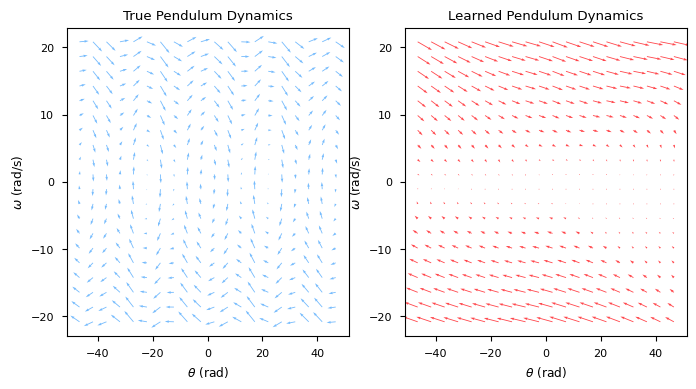


(32, 'relu', 'xavier_norm', 'all_states', 'node', False)



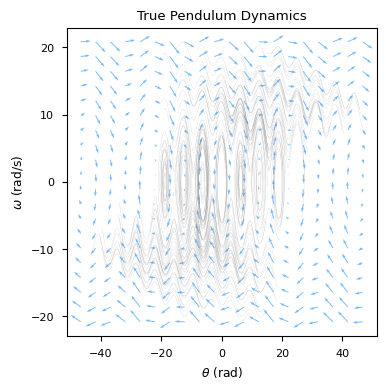

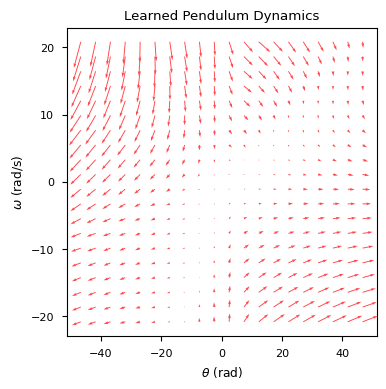

0: 472.0092871912619
1: 452.04984568273125
2: 430.3134593548389
3: 410.39948939366593
4: 387.99008362128427
5: 368.89489646616136
6: 350.5513481175348
7: 328.4813255400928
8: 308.9441946645715
9: 290.69362250833825
10: 267.6011384291941
11: 246.7952709755459
12: 228.660670862396
13: 211.40920855396126
14: 199.57949041205424
15: 189.23679177653193
16: 181.13664620609728
17: 183.31084780929714
18: 181.5355038827843
19: 175.68569139048984
20: 178.07982152744034
21: 180.6320810526209
22: 177.55283187735236
23: 178.43202524934915
24: 178.41301506638328
25: 177.67316493720736
26: 178.35690264712161
27: 178.16523759432675
28: 175.2350804812174
29: 176.09207474827204
30: 175.3629738213924
31: 174.40358834468563
32: 174.92655677011865
33: 173.53798841997926
34: 173.371926338105
35: 175.6753189788121
36: 171.89616291931355
37: 175.73538479311782
38: 174.8192599481068
39: 176.94814772560008
40: 174.41773592648642
41: 170.60265188904162
42: 173.16843788640134
43: 172.78177360668525
44: 173.0179612

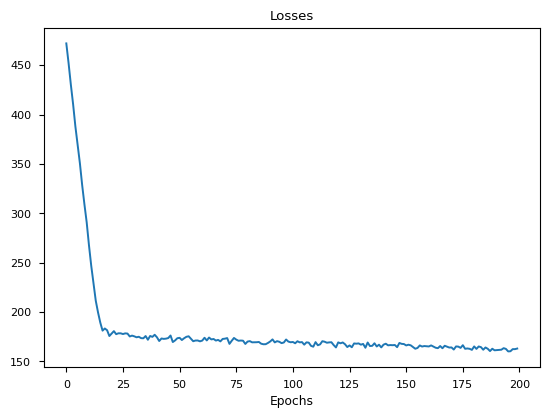

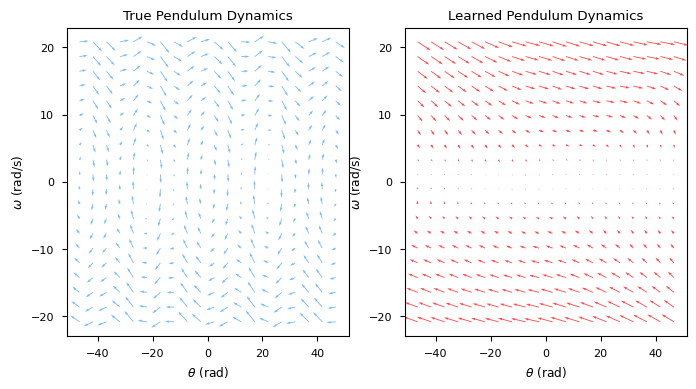


(32, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d', True)



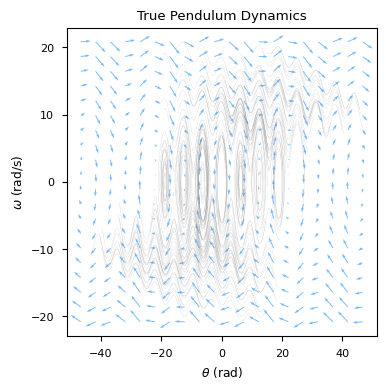

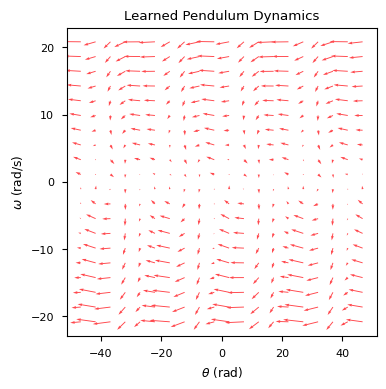

0: 480.6311839934885
1: 458.5635086103752
2: 436.95991366277974
3: 415.7238423644555
4: 393.67905681126604
5: 377.03369059127374
6: 360.5232350060008
7: 341.2795915702732
8: 325.5966356666848
9: 310.47106477196274
10: 293.9557606149484
11: 279.48161848673345
12: 268.0387517914927
13: 254.3173674329822
14: 242.55860111128263
15: 230.69206375230806
16: 221.51908405068724
17: 213.99175987387116
18: 206.9964111021327
19: 196.6382555340168
20: 195.4265802395615
21: 194.03176007235308
22: 188.30200407827354
23: 187.64437276515673
24: 186.63576633720808
25: 185.36575931869717
26: 185.3091145111921
27: 184.5416160833992
28: 181.83638810167147
29: 181.45320647054547
30: 181.3023198101589
31: 181.3884585835573
32: 180.45737043536073
33: 179.45906501879094
34: 179.75805859658547
35: 181.61939793351218
36: 177.15837740247204
37: 182.22759600057495
38: 180.1923338684723
39: 182.31000330888733
40: 180.11953602902278
41: 175.7034103560795
42: 178.6234172793823
43: 178.42654014438753
44: 178.481207983

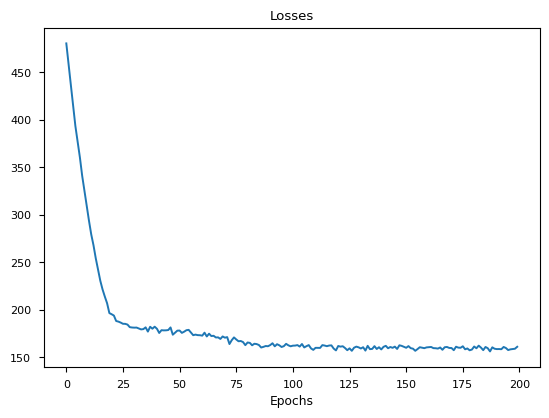

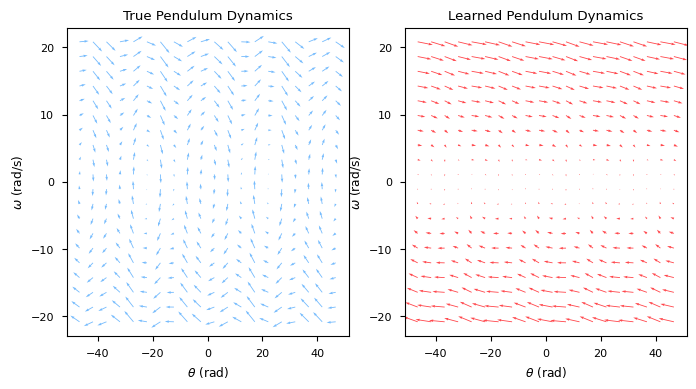


(32, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d', False)



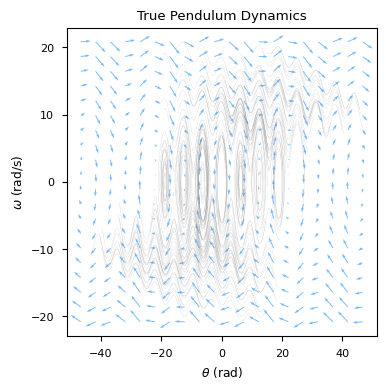

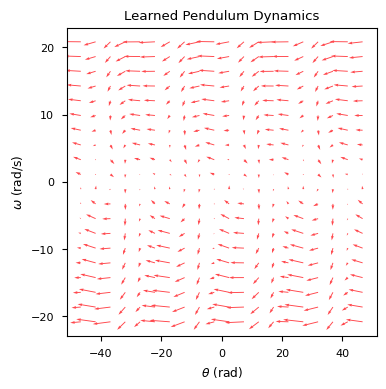

0: 480.57436567838056
1: 458.3782252271152
2: 436.7121381769829
3: 415.3542462578074
4: 392.92393095566825
5: 375.90751370274484
6: 359.0433664146563
7: 339.4942500938086
8: 323.76138983038027
9: 308.3543001815815
10: 291.49316572644705
11: 276.26055248939633
12: 264.183699102936
13: 249.68405108176094
14: 237.43836188804133
15: 224.99849405619685
16: 215.6917300995474
17: 207.79324442269987
18: 200.9926315071836
19: 190.63230383423533
20: 189.80703407732565
21: 189.077205229874
22: 184.0863770779411
23: 183.79590961292118
24: 183.3734128444432
25: 182.67131988349476
26: 182.80588271644572
27: 182.25655683895897
28: 179.9264130603592
29: 179.69422772136954
30: 179.11676659830272
31: 179.53564450633667
32: 178.45731070146687
33: 177.61062450384
34: 177.56774026984945
35: 179.12337457573358
36: 174.65326074512973
37: 179.3097394052186
38: 177.31925809855122
39: 179.122671600262
40: 176.81532834668042
41: 172.35330303925903
42: 174.86762970825023
43: 174.22632608397564
44: 174.09672125273

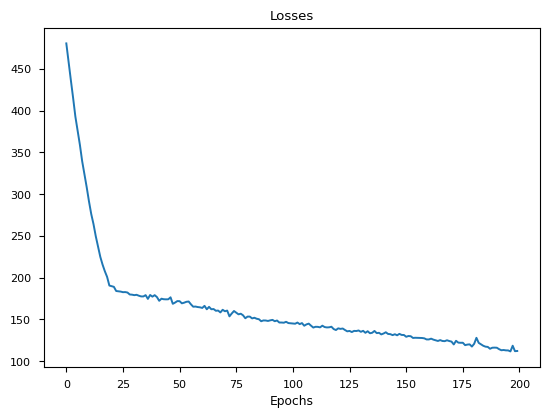

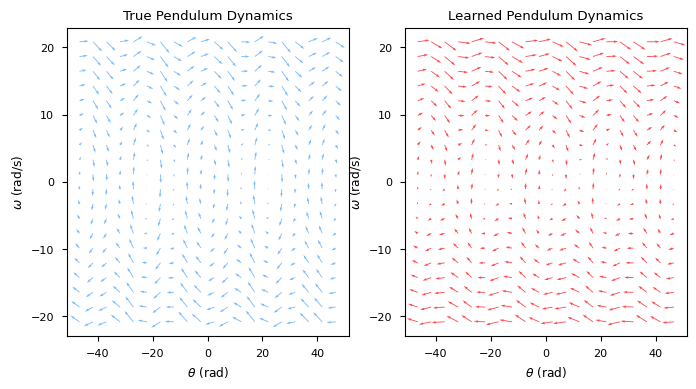


(32, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', True)



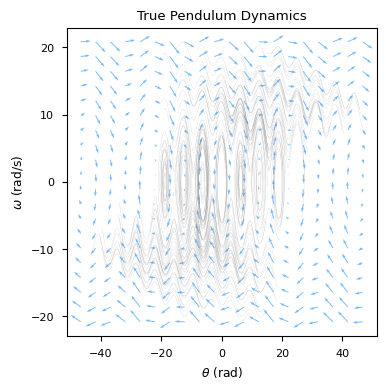

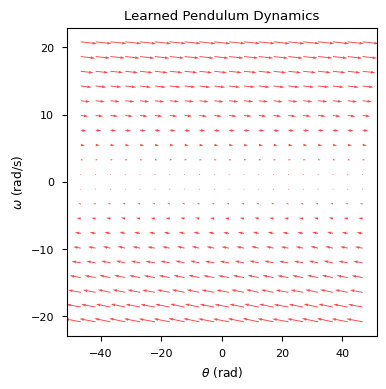

0: 209.42927204276026
1: 200.18565773158068
2: 192.1322998241104
3: 185.59089014139292
4: 185.26978770557238
5: 184.1676823715304
6: 181.62649870660192
7: 182.12584961497737
8: 184.2958779514972
9: 184.96879914929426
10: 180.4485175574815
11: 180.70480232833074
12: 180.75746548437428
13: 181.33672380805493
14: 181.82201338639658
15: 176.97297308336178
16: 175.41210531882734
17: 181.63540647619521
18: 181.6323036850663
19: 175.92989263329608
20: 179.3917018151638
21: 181.40497036915468
22: 178.20416186364537
23: 179.2960865606097
24: 179.29528022835422
25: 178.76807847089972
26: 179.16875345049274
27: 178.9194369924726
28: 176.00353798982812
29: 176.1215973608349
30: 176.00028980056376
31: 175.9920173169874
32: 175.27640614424536
33: 174.13081232756994
34: 173.96235401456784
35: 176.12302240303816
36: 171.7708868255401
37: 176.7258603123216
38: 174.56223485024265
39: 176.69822092395745
40: 174.44574640453556
41: 169.996650211264
42: 172.71611730736055
43: 172.41852334899798
44: 172.6473

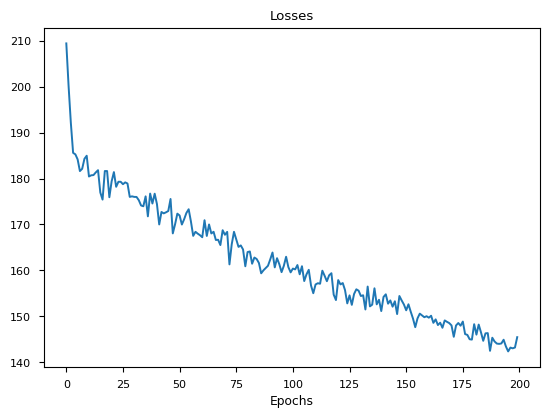

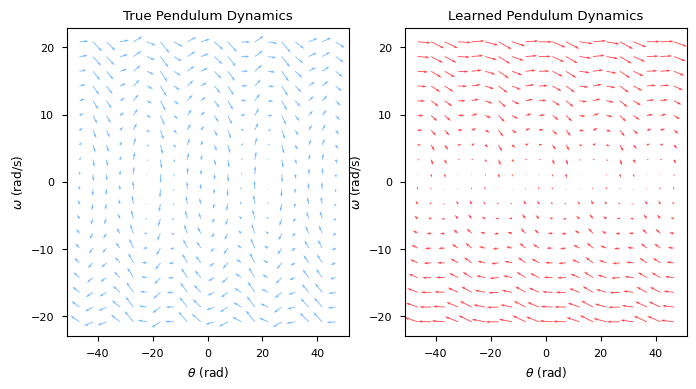


(32, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', False)



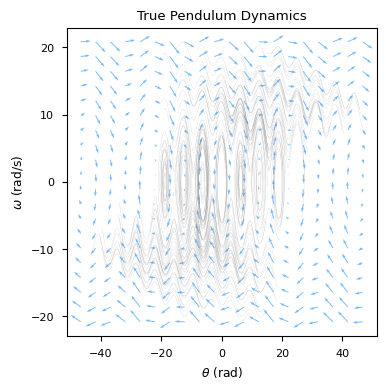

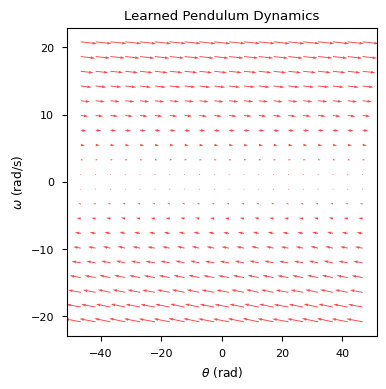

0: 209.43069640588828
1: 200.2036835905116
2: 192.127793236218
3: 185.47259949773482
4: 185.08065649500278
5: 183.93538935237524
6: 181.25129140677333
7: 181.61818602883437
8: 183.52715583699086
9: 184.19073327536645
10: 179.67236360709117
11: 179.86416919023802
12: 179.94621000891033
13: 180.352376271276
14: 180.84158281120125
15: 176.02838408968748
16: 174.5546414859386
17: 180.32860564056324
18: 180.22866899453462
19: 174.4900368314542
20: 177.84974874887283
21: 179.84255271645586
22: 176.86672508783636
23: 177.4657288259257
24: 177.50169601740143
25: 176.92313652462482
26: 177.10949689998057
27: 176.77873958784372
28: 173.83063626547937
29: 174.08880324721696
30: 173.54125255811257
31: 173.70870259072814
32: 172.67092595155086
33: 171.64183987677112
34: 171.14636651421816
35: 173.11053422031597
36: 168.81117941294056
37: 173.4307523450751
38: 171.32509077640756
39: 173.15703411263834
40: 170.93127248757455
41: 166.42757827188146
42: 168.770739423864
43: 168.31593148535555
44: 168.2

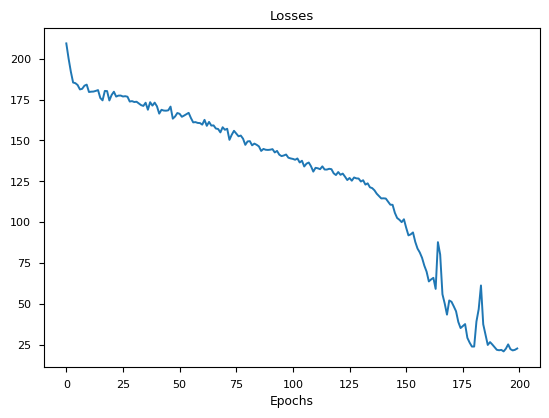

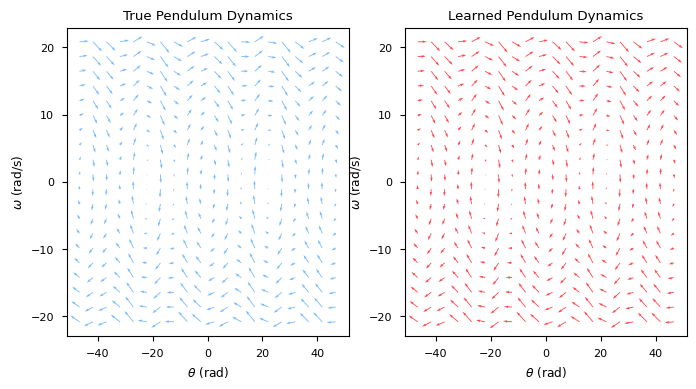


(64, 'tanh', 'xavier_norm', 'all_states', 'node', True)



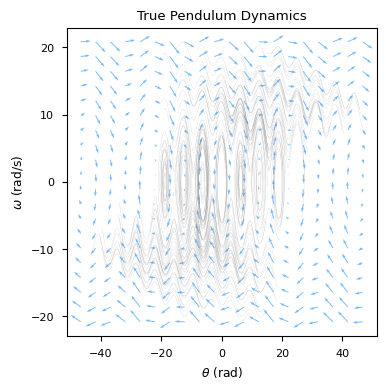

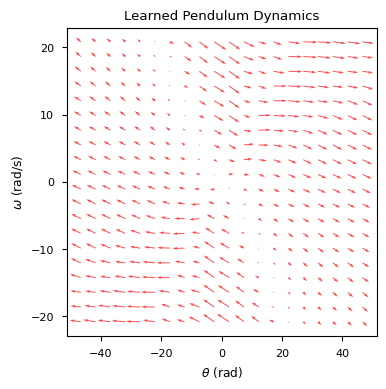

0: 587.5907687418066
1: 584.3725791328596
2: 577.8446022466794
3: 570.4975201168664
4: 554.8179824901267
5: 550.1499603269253
6: 546.3277626012757
7: 530.5972095569491
8: 527.1177291193216
9: 522.6142020846313
10: 512.105519331681
11: 504.88713708468265
12: 506.81874256890217
13: 493.0880019455795
14: 483.633087179577
15: 491.4543970575397
16: 483.89037144659596
17: 473.08934792060575
18: 454.79113281991084
19: 463.0826065562219
20: 456.5460117575915
21: 448.04029204371415
22: 452.24417759633764
23: 442.24504685710264
24: 437.60291334447305
25: 431.43268238687716
26: 424.303387244221
27: 418.2489366776503
28: 410.73665459835104
29: 412.22364377437145
30: 400.2841789760229
31: 398.63162980176406
32: 394.5662760475239
33: 394.0084339527934
34: 386.9765869052623
35: 390.10158310534507
36: 383.02484553177385
37: 379.82740276446043
38: 377.94686251080464
39: 380.82148983936736
40: 372.37263760990595
41: 368.5868543961008
42: 365.611970083658
43: 365.6434774098716
44: 366.98611852307204
45: 

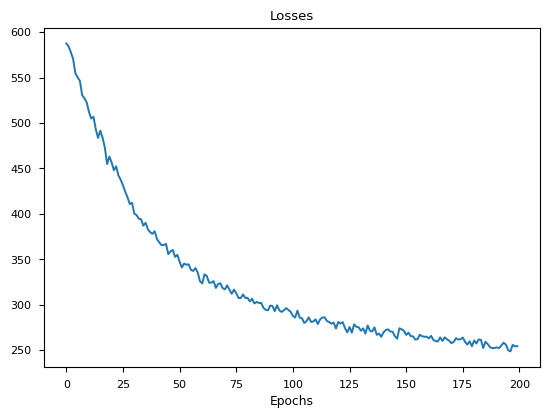

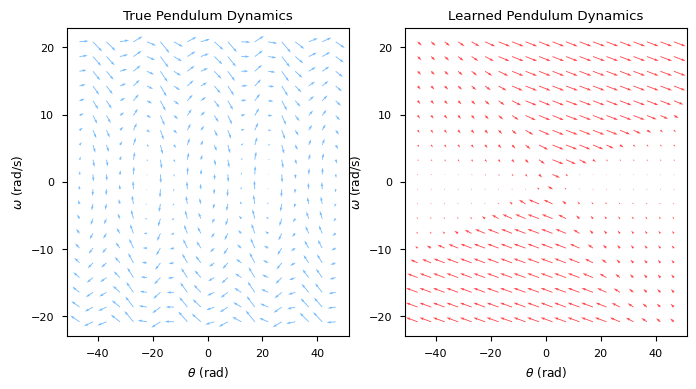


(64, 'tanh', 'xavier_norm', 'all_states', 'node', False)



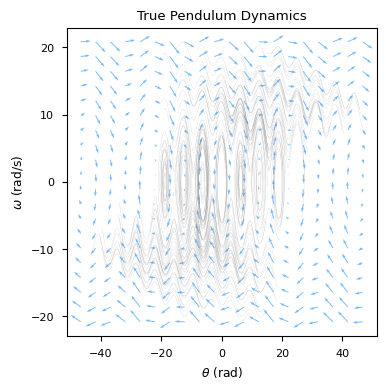

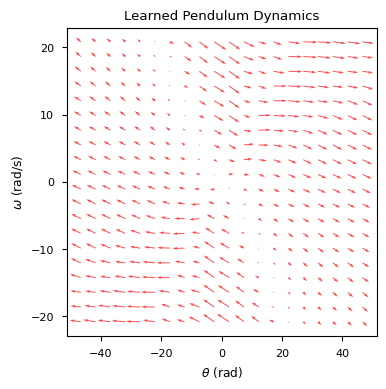

0: 587.569494976698
1: 584.3331263782856
2: 577.8314465699659
3: 570.4618735103411
4: 554.7691549245114
5: 550.0742259162887
6: 546.2518889139395
7: 530.4706919799482
8: 526.8192986430158
9: 522.2800896747802
10: 511.6900948952327
11: 504.261519676074
12: 506.16389129210995
13: 492.33125920818003
14: 482.9739819640565
15: 490.6005906626093
16: 483.06123755315565
17: 472.0699813242602
18: 453.70580222707304
19: 461.81933670007265
20: 455.20959296654837
21: 446.9117675172321
22: 450.6125898134836
23: 440.5140347617111
24: 435.99581331983416
25: 429.7745535392029
26: 422.4049023964685
27: 416.2298591290727
28: 408.9555967542073
29: 410.1717998404348
30: 398.05788593608816
31: 396.57096590134165
32: 392.1561342525374
33: 391.838960376228
34: 384.3088456595174
35: 387.23711652127724
36: 380.22302673960485
37: 376.92769063144993
38: 375.0268477658317
39: 377.7075935833234
40: 369.33900597653957
41: 365.7874095895898
42: 363.03846254546266
43: 362.26014193560206
44: 363.611239355553
45: 351.9

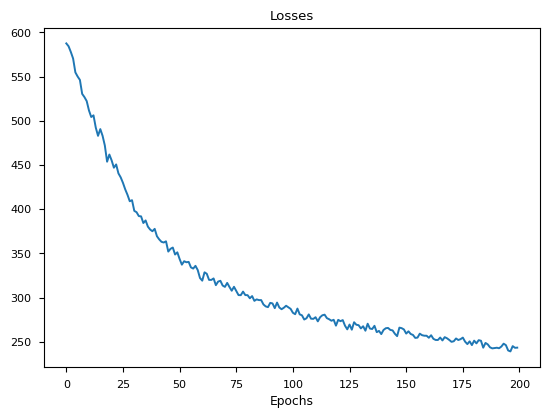

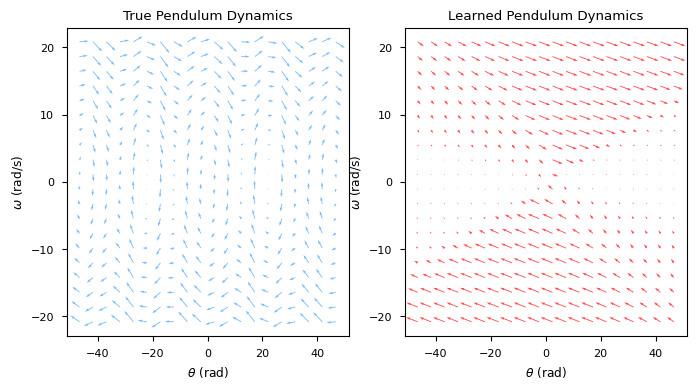


(64, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d', True)



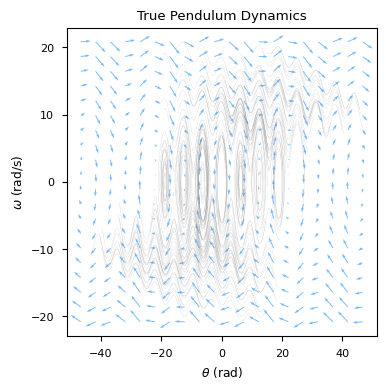

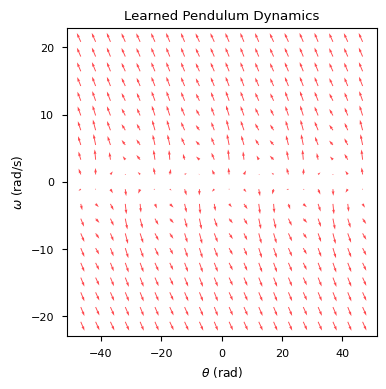

0: 651.6710313802237
1: 647.7027982972692
2: 638.733483285787
3: 628.1761276699168
4: 610.1165721270837
5: 602.6523173470201
6: 597.2129576346301
7: 577.4383957879827
8: 570.405217049111
9: 563.5390543199233
10: 550.3278932876991
11: 540.1009838342106
12: 539.3496381012111
13: 521.1802142125716
14: 508.5859825606348
15: 514.1030876109276
16: 504.11232493173225
17: 489.60302014093895
18: 468.1764933981987
19: 475.43192461588063
20: 466.89163922772576
21: 457.10606967504435
22: 461.32922720528927
23: 450.9087487062188
24: 445.9975120884561
25: 439.5825701567607
26: 431.68807701834623
27: 426.14613202235716
28: 419.7287709098412
29: 420.403430645907
30: 408.9739628039926
31: 408.1633170933849
32: 403.5266065462756
33: 403.2891651855435
34: 396.6591631448883
35: 399.57855725168696
36: 393.14377660695357
37: 390.58067003543215
38: 388.63893719630505
39: 391.6326754805413
40: 383.0793454434994
41: 380.17595600811137
42: 377.0374520860356
43: 376.941703016842
44: 378.87670150186534
45: 366.55

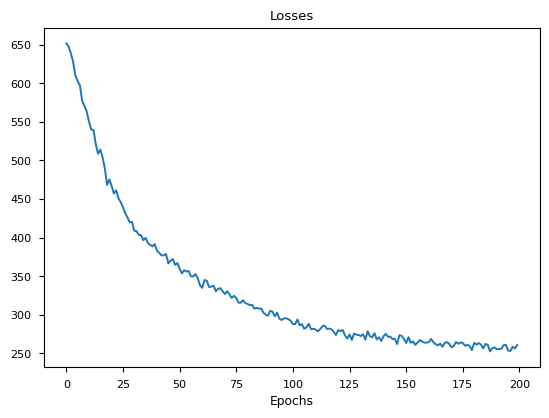

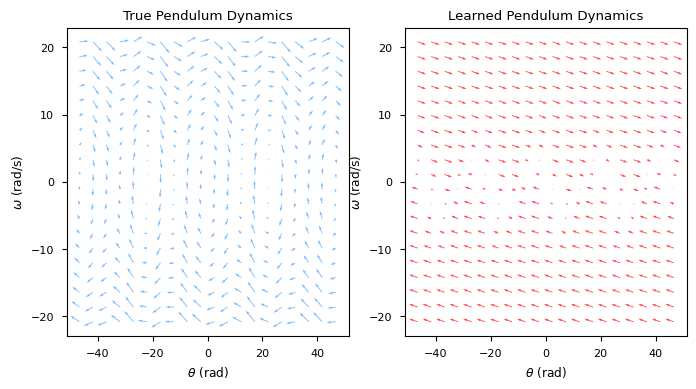


(64, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d', False)



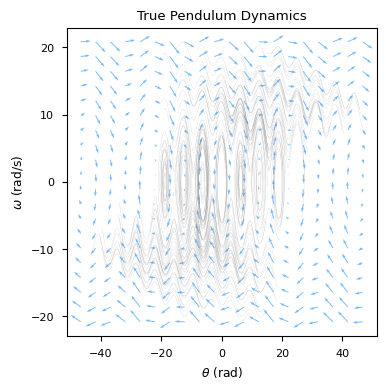

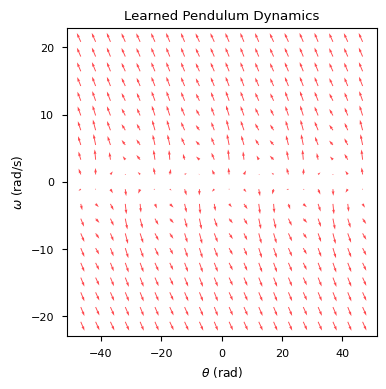

0: 651.6544394795947
1: 647.686766267014
2: 638.7562721255538
3: 628.1809486357814
4: 610.0870021763535
5: 602.632696690884
6: 597.1116040821717
7: 577.3174841354544
8: 570.1432153877084
9: 563.2582081125374
10: 549.934526052662
11: 539.5394888527148
12: 538.7060706437
13: 520.3920352473078
14: 507.8192987272775
15: 513.1157132092392
16: 503.0187409653088
17: 488.3981452908154
18: 466.72974656589815
19: 473.92178956755856
20: 465.31154513251454
21: 455.4235501501544
22: 459.47653475416297
23: 448.7574869008286
24: 443.8907302404739
25: 437.2844331382491
26: 429.34717612803416
27: 423.59409983457016
28: 417.26436209921934
29: 417.7167312184638
30: 405.8375541086326
31: 405.64725332002433
32: 400.6475914761601
33: 400.6052822746653
34: 393.96987633746653
35: 396.6679336996275
36: 390.4599483363581
37: 387.5925142027716
38: 386.0221133591416
39: 388.86872965596604
40: 380.5512702470532
41: 377.8952138273336
42: 374.9755150427944
43: 374.9140400439735
44: 376.63234990906665
45: 363.9212594

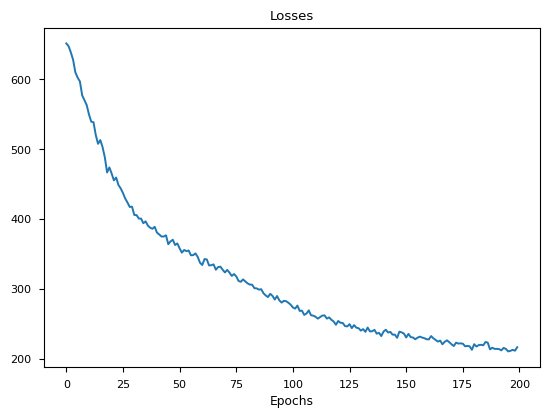

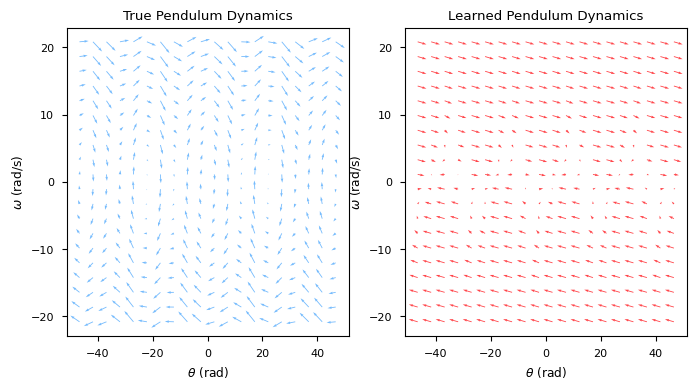


(64, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', True)



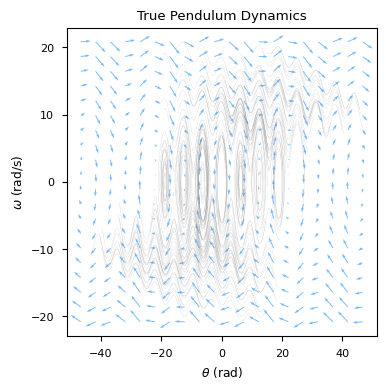

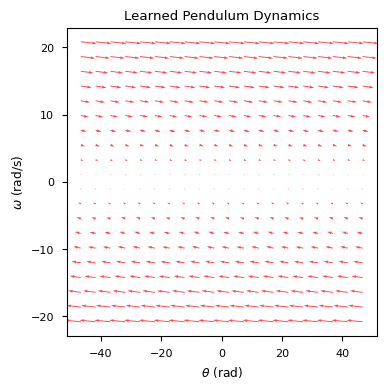

0: 251.6844680174079
1: 247.30033649158293
2: 240.29023639046318
3: 230.77586702603674
4: 229.34249350469128
5: 224.41899705362766
6: 218.06341831498426
7: 219.79637709811666
8: 219.92165981379202
9: 221.24320992624445
10: 210.27076013464392
11: 210.40545092833952
12: 210.37745069365343
13: 210.40521359798782
14: 214.14250580824884
15: 204.95272983691146
16: 204.572175110319
17: 213.90614361857652
18: 216.79934813078015
19: 206.37715808730735
20: 213.00758901999964
21: 218.52699452590085
22: 211.07264212168565
23: 213.8225295679382
24: 215.29670515027112
25: 212.85237535728214
26: 212.74607620407483
27: 213.81747875232764
28: 207.83395695296906
29: 212.6976029621722
30: 209.49761667270408
31: 209.80070348574228
32: 208.29233824178954
33: 209.16784862215277
34: 208.5560872681375
35: 210.97336661507808
36: 205.3181375888456
37: 212.74473942545055
38: 211.17949399480065
39: 213.65816174979193
40: 211.40860935559863
41: 205.72333679620732
42: 208.48304513559796
43: 208.36980000075113
44: 2

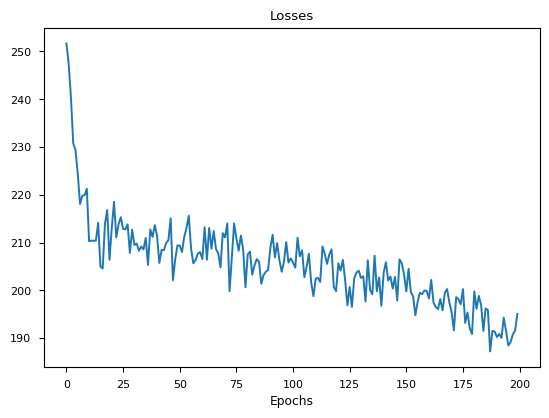

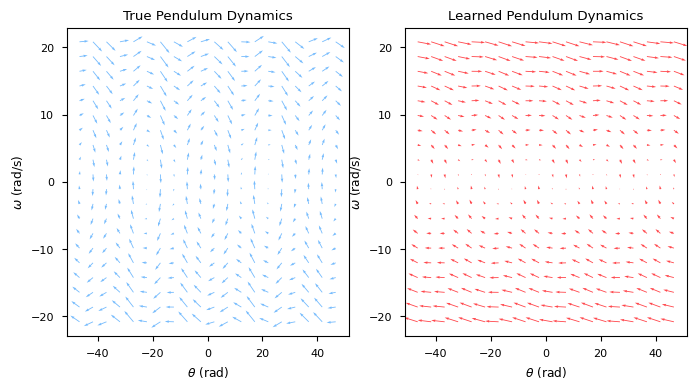


(64, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', False)



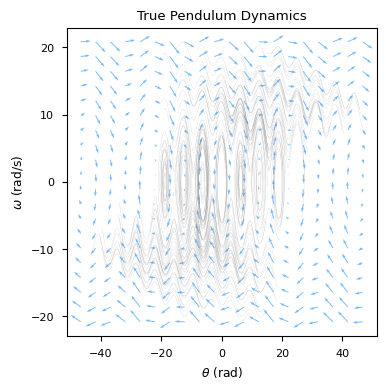

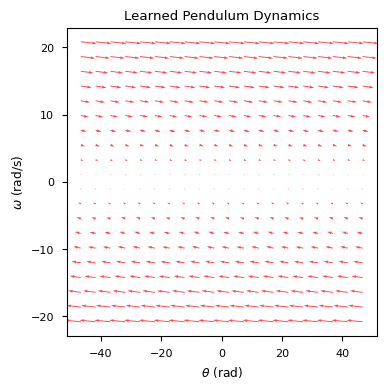

0: 251.65011430271406
1: 247.3152655825656
2: 240.4074953916868
3: 230.75266282316744
4: 229.2128383032796
5: 224.1079837315888
6: 217.43121054156705
7: 218.95576501350126
8: 218.9097183584192
9: 220.0483887027596
10: 209.07681173525944
11: 208.9829467364563
12: 208.9652492263542
13: 208.88439523721934
14: 212.770370499179
15: 203.1909125510678
16: 204.03550459683723
17: 212.00746704167003
18: 214.86503167853718
19: 204.45449587287038
20: 210.99489245744672
21: 216.58901382805374
22: 209.76763663773747
23: 211.12147123091387
24: 213.44002454521905
25: 210.91676256611095
26: 210.49537351942058
27: 211.57847250803732
28: 205.6291528895036
29: 210.39016249266885
30: 206.59026001207673
31: 208.53579354528458
32: 206.21752548886855
33: 207.55579316235355
34: 206.7561001547444
35: 208.4275710418698
36: 203.30834588578824
37: 209.6850783757422
38: 208.7120387622188
39: 210.82536824937534
40: 209.07637734249877
41: 203.79344363460336
42: 206.59099556166265
43: 206.18758213592406
44: 207.081003

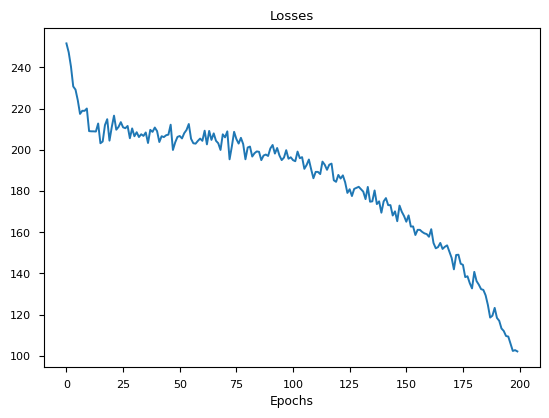

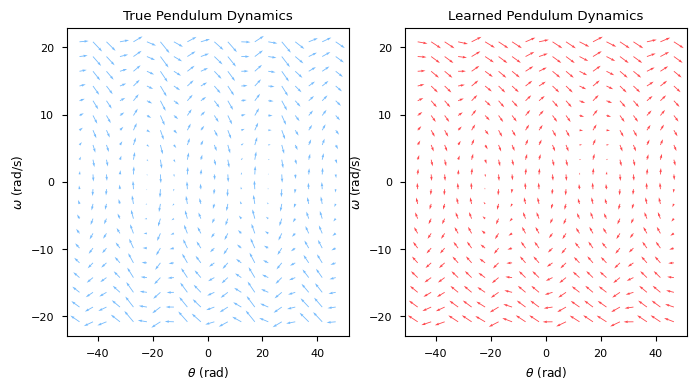


(64, 'relu', 'xavier_norm', 'all_states', 'node', True)



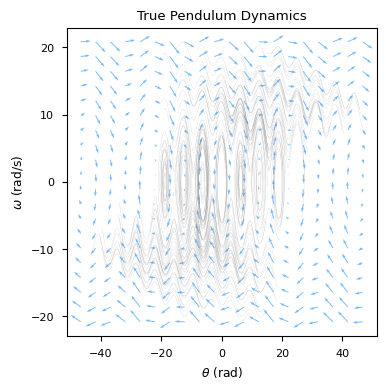

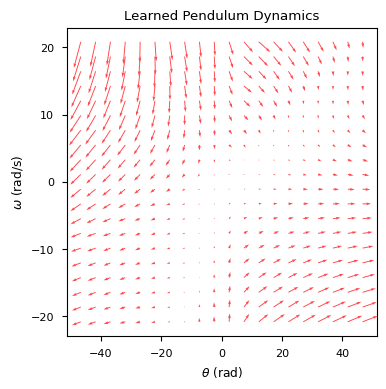

0: 608.7799932108702
1: 599.0370575151778
2: 579.5009360804415
3: 568.6916727469074
4: 544.6216275651832
5: 532.7593034519048
6: 520.8231969510565
7: 498.7967841921502
8: 486.55357737516846
9: 476.2539075379077
10: 456.6297617227372
11: 440.9498727107639
12: 431.46454634203116
13: 412.4507223934281
14: 397.5034311096369
15: 388.5332713772148
16: 373.61573472388653
17: 356.39165253948573
18: 337.36768221408636
19: 321.9162131222492
20: 311.7622470899006
21: 301.94497167899624
22: 287.68274994817597
23: 277.2844829672787
24: 269.8481410612615
25: 260.7338007424669
26: 257.5358926308834
27: 252.12898724735413
28: 242.47405856445963
29: 244.13646045537396
30: 237.9383804505458
31: 234.59511949855133
32: 235.119646768695
33: 231.0186804209396
34: 233.63005773135757
35: 235.87308887878112
36: 227.45123801869363
37: 235.04068518755741
38: 232.14071699155872
39: 236.51096909258257
40: 229.51197351315346
41: 224.46198875169765
42: 226.85492082942466
43: 226.63199886981513
44: 228.7533714219322


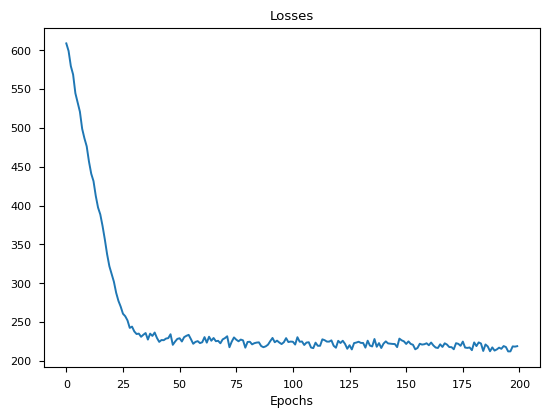

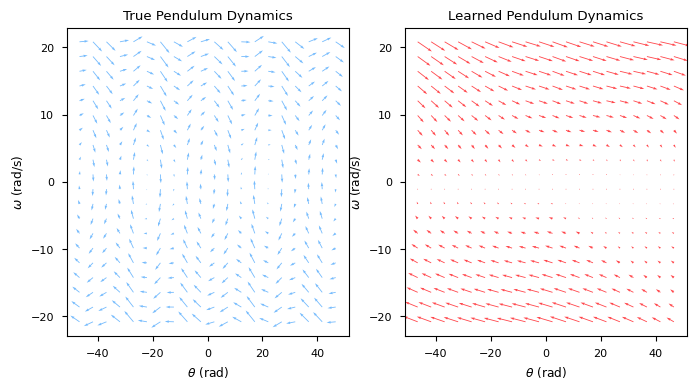


(64, 'relu', 'xavier_norm', 'all_states', 'node', False)



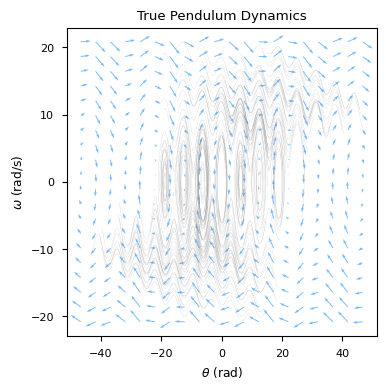

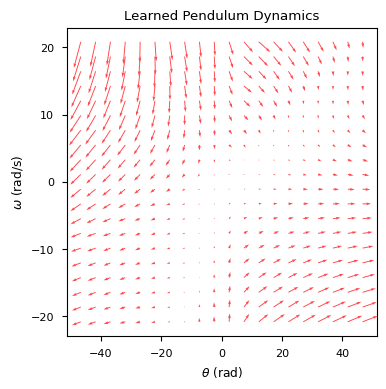

0: 608.7720907865267
1: 598.9877638535172
2: 579.3988892946998
3: 568.6219045430391
4: 544.3286327882216
5: 532.4641458152802
6: 520.433159970045
7: 498.2231532953851
8: 485.9625402547585
9: 475.59304616776035
10: 455.9921298310933
11: 440.2078059998994
12: 431.02069597264347
13: 411.99384255090814
14: 397.45310468172676
15: 388.6837428018261
16: 374.04723261427006
17: 355.6394589924055
18: 336.47987427902365
19: 320.30162690597246
20: 308.6038126864434
21: 297.9285142222893
22: 281.69799442815577
23: 269.31788560460166
24: 261.69127304323223
25: 252.35941668321328
26: 248.84025355004366
27: 243.61018045189059
28: 234.37644770885825
29: 236.65764151637825
30: 230.01557762755505
31: 227.74736503862755
32: 227.88042342067448
33: 225.01429304545871
34: 226.61957016516843
35: 228.64861279341716
36: 221.2488315683672
37: 229.32081336190421
38: 227.31495670946236
39: 231.64749657369393
40: 225.40115053684704
41: 220.80520202433078
42: 223.54790030227701
43: 222.10547686762078
44: 224.6739081

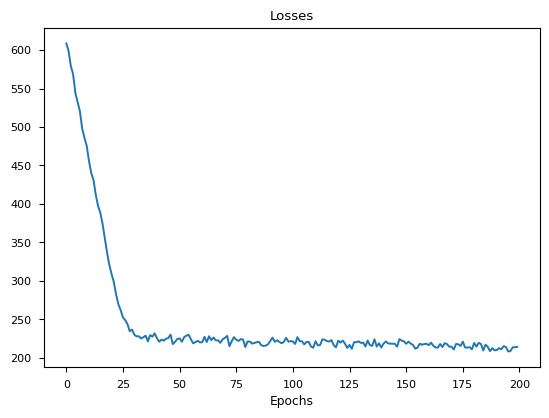

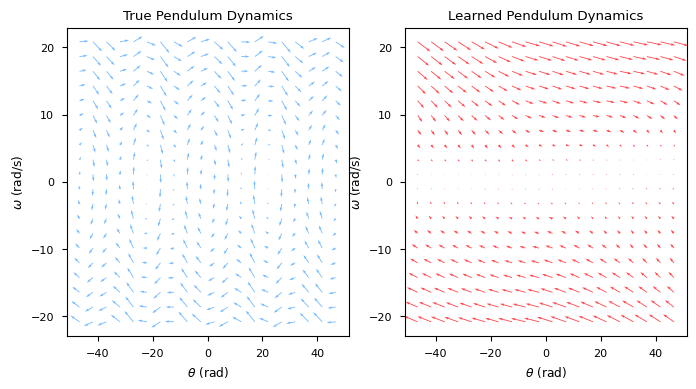


(64, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d', True)



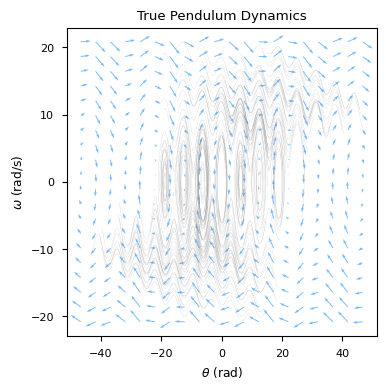

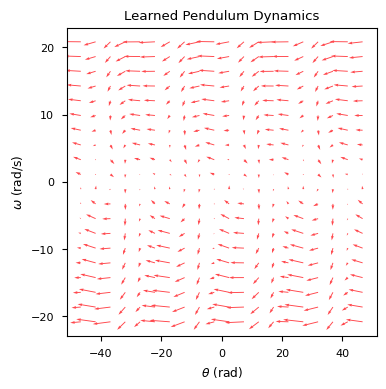

0: 619.7087851159616
1: 607.3678386600172
2: 593.0616699048999
3: 576.914549880615
4: 552.5961581709957
5: 540.4999988102984
6: 529.3696211252943
7: 508.7201121529768
8: 497.6077912776463
9: 486.936210359826
10: 471.58770858576526
11: 458.0884760678207
12: 452.3282146201684
13: 434.45346216874566
14: 421.03319675121696
15: 415.9863851684949
16: 405.92857382272786
17: 392.15658018020173
18: 375.78108695761557
19: 366.9153451210297
20: 360.1761017019783
21: 350.60397620716867
22: 341.071361912934
23: 329.450934709871
24: 321.4422277000301
25: 312.66740983959016
26: 306.0743457246871
27: 295.84942844566353
28: 285.92881331763385
29: 280.408479353427
30: 272.2466213332903
31: 267.49820903830573
32: 261.5124986729741
33: 257.10535444919395
34: 253.29683724254815
35: 252.26958099969102
36: 241.73453760942695
37: 248.74076306485782
38: 244.13456768920855
39: 246.2662584480031
40: 239.48818689752764
41: 233.07711478462576
42: 235.57421087842516
43: 233.5984793892167
44: 236.28011817554471
45: 

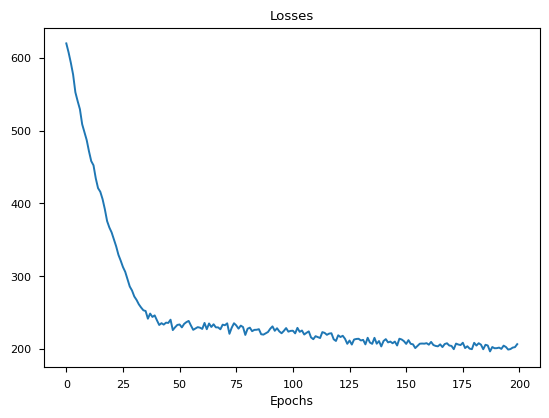

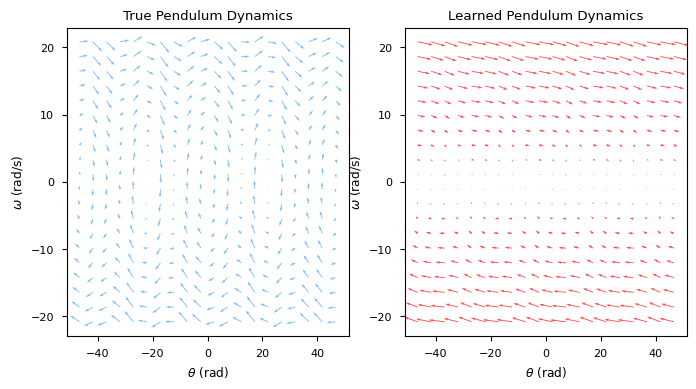


(64, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d', False)



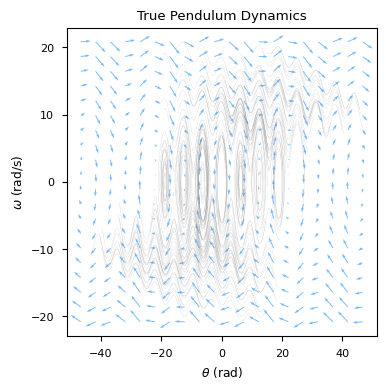

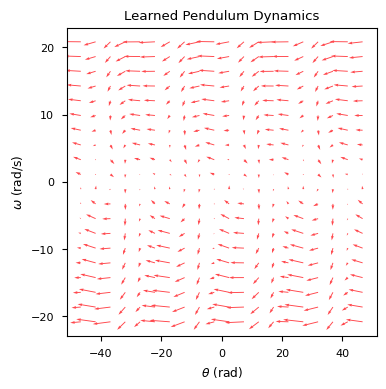

0: 619.6904218338351
1: 607.248474933827
2: 592.9110978624761
3: 576.6569967604213
4: 552.2394444514977
5: 540.1148398624626
6: 528.7830106132255
7: 507.8542942981404
8: 496.4190472147111
9: 485.40170302633544
10: 469.8826931595679
11: 456.07230893358906
12: 450.2757230010507
13: 432.1314578375445
14: 418.7536692397589
15: 413.50952775963486
16: 403.23657748572197
17: 388.79177764919683
18: 371.69563047082556
19: 362.6367570045171
20: 355.37578843581025
21: 345.4299306669962
22: 335.7949347693144
23: 322.9352653326038
24: 315.1121639420184
25: 305.97798037813084
26: 299.25075758644476
27: 288.5512260286149
28: 278.4874835434856
29: 272.6380435282419
30: 264.01015339885174
31: 260.14002851751036
32: 253.74981280803044
33: 249.68898394627925
34: 245.75590277735347
35: 244.5278501494291
36: 234.2447549688113
37: 241.7151575811788
38: 237.75012234661284
39: 240.14314697434813
40: 234.2287474910862
41: 227.7922372135434
42: 231.006224315721
43: 229.40258409472153
44: 232.01165337996667
45: 

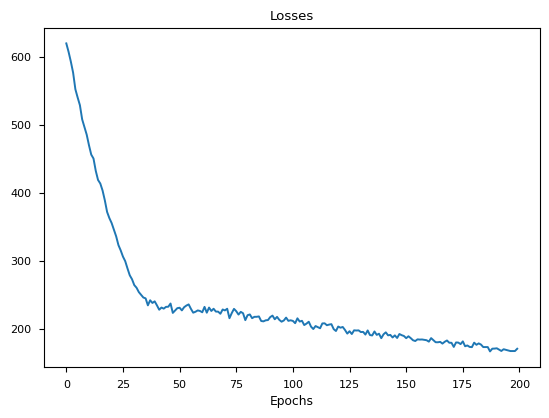

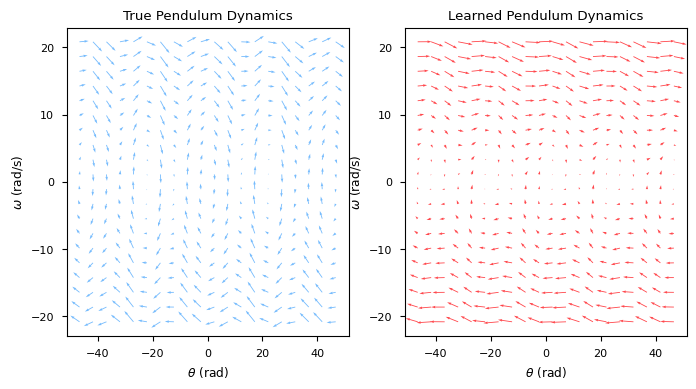


(64, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', True)



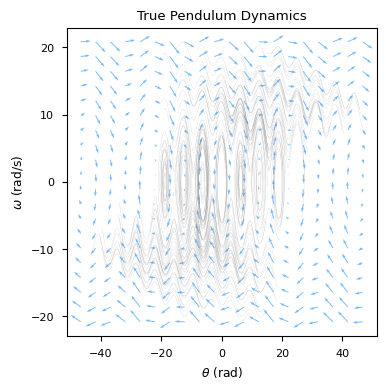

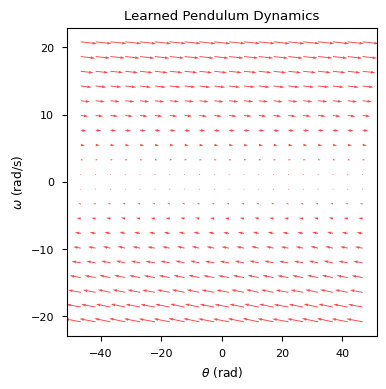

0: 270.84672653522864
1: 266.15445214109576
2: 258.44301106597896
3: 247.19290712112985
4: 247.87696123693314
5: 242.6078215285392
6: 235.58410502093247
7: 238.74302483502942
8: 240.02376675429684
9: 241.4903404665577
10: 230.7324731329889
11: 231.4910371807396
12: 231.85378268690837
13: 233.0094891002863
14: 235.21083252175185
15: 224.74055969627585
16: 223.38496223976793
17: 235.84421468024695
18: 238.406388289059
19: 226.39908738817655
20: 233.34322903499378
21: 239.52484829445473
22: 230.78201715302768
23: 233.70878036806783
24: 234.34588326945297
25: 233.1287165570957
26: 233.20847708116912
27: 233.1362918586571
28: 227.4090894278319
29: 231.59900747884564
30: 227.88560052460628
31: 227.63712417468435
32: 226.60078079144495
33: 225.10295132666795
34: 226.837587573455
35: 229.46844661370207
36: 220.58035479392026
37: 231.47029673116924
38: 228.39574954274843
39: 232.17795495068412
40: 227.12373358825462
41: 220.9853278823539
42: 224.63416187314849
43: 223.33228676071022
44: 226.667

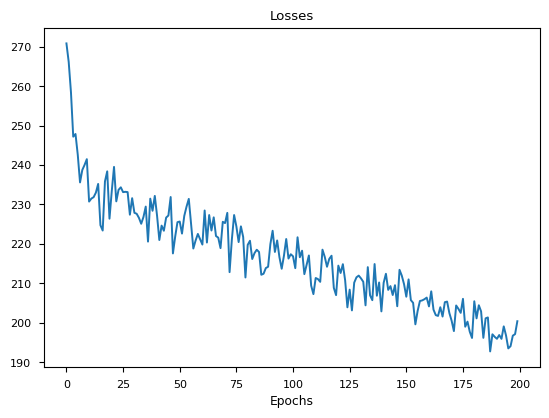

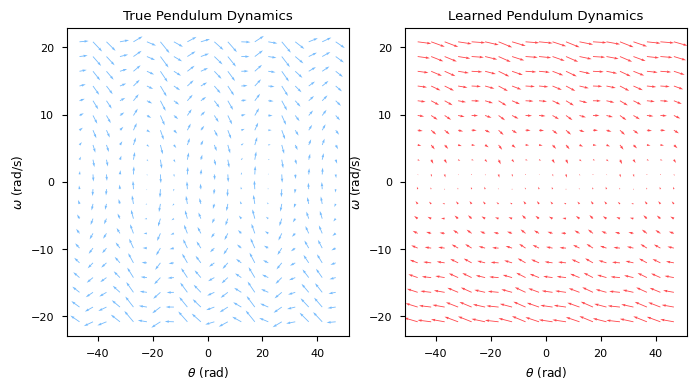


(64, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', False)



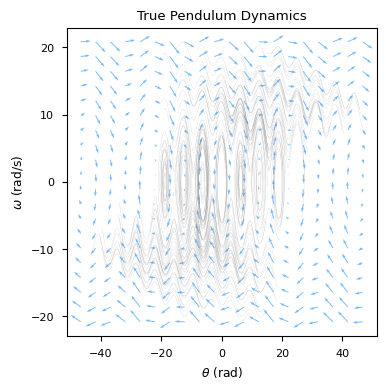

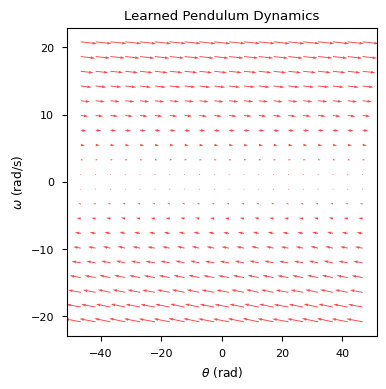

0: 270.8461520644863
1: 266.22717794275457
2: 258.5876002855657
3: 247.27377097678635
4: 247.83387532812236
5: 242.43174581547376
6: 235.2422624677315
7: 238.33637466843658
8: 239.54279668386872
9: 241.04205462598594
10: 230.21494680987388
11: 230.7910703701262
12: 231.32064779940293
13: 232.12611228319267
14: 234.40870841607887
15: 224.29128761027178
16: 223.2969870944986
17: 234.82482200092454
18: 237.1402241288801
19: 225.31924143976937
20: 232.1531406376882
21: 238.36055877232621
22: 230.00568675325894
23: 232.30386094915903
24: 233.2285904525911
25: 231.96883009919173
26: 231.82138038022032
27: 231.74735939779032
28: 225.992291123131
29: 230.25215572588172
30: 226.13440540096278
31: 226.42467711327023
32: 225.07539507073517
33: 223.72764757199107
34: 225.16552657572288
35: 227.70140973770214
36: 218.79048383258433
37: 229.33033618974102
38: 226.44874290786294
39: 230.0800304675125
40: 225.2294095452959
41: 219.1534523424826
42: 222.57623237927956
43: 221.28621182475726
44: 224.168

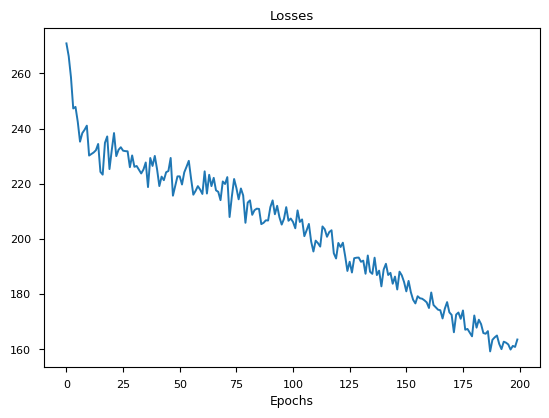

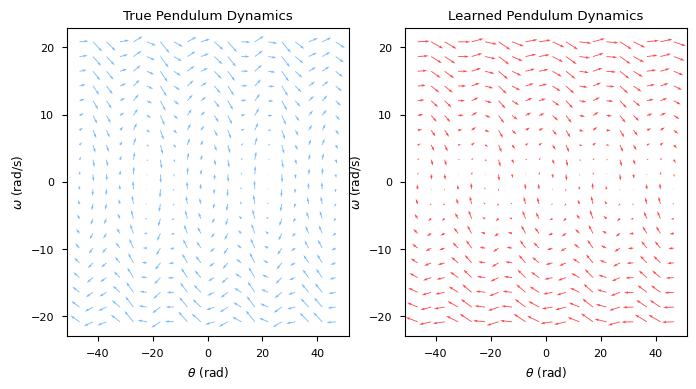


(128, 'tanh', 'xavier_norm', 'all_states', 'node', True)



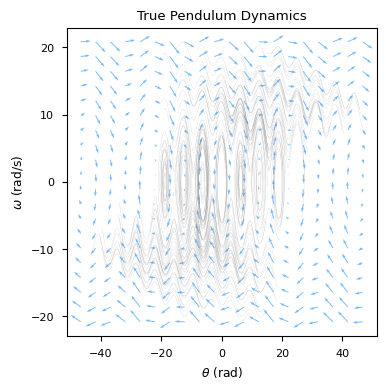

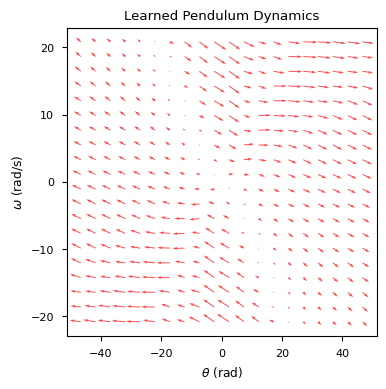

0: 868.8610258635674
1: 866.0091443041372
2: 861.2054415330442
3: 852.7420257248764
4: 850.8253547994336
5: 837.9398979824643
6: 835.8934244077898
7: 824.0586662154832
8: 824.9301821893933
9: 816.0190918204646
10: 802.786884208723
11: 804.5672889515056
12: 796.0388968943628
13: 796.3456823682641
14: 788.1360520914556
15: 784.3681930895276
16: 778.0488343668014
17: 767.4756740210828
18: 766.4980876603307
19: 762.0206923523224
20: 757.4947767353248
21: 742.6265386352657
22: 748.7447714569785
23: 744.0773336862017
24: 737.8538263511521
25: 733.5714269998775
26: 721.2052787499684
27: 722.8543325300069
28: 718.950165548114
29: 713.5200533550435
30: 701.7646976599013
31: 704.7163973635224
32: 689.9696023195038
33: 696.4504065169568
34: 688.9950535612545
35: 685.9076904189403
36: 676.8737819309025
37: 676.4175789987619
38: 671.2261451475215
39: 665.8604113934831
40: 664.4256065905912
41: 657.0701065128246
42: 655.2728736608608
43: 648.7267843208357
44: 643.896489237839
45: 644.1449503389007
4

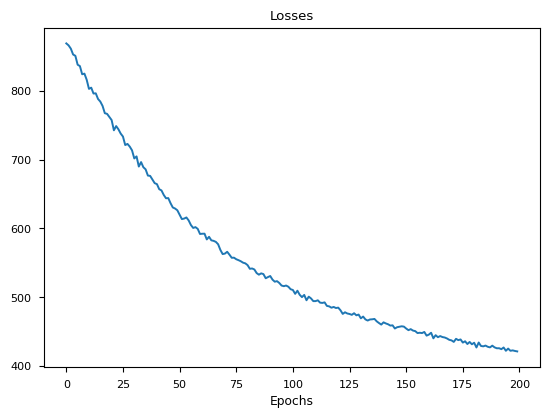

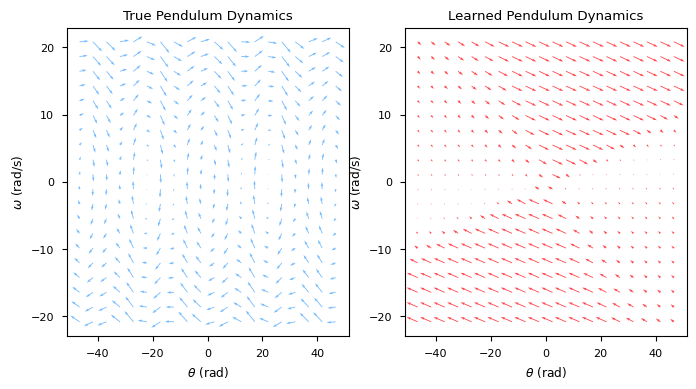


(128, 'tanh', 'xavier_norm', 'all_states', 'node', False)



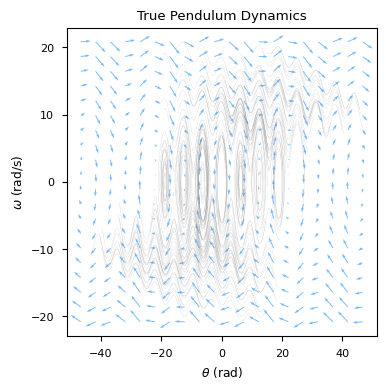

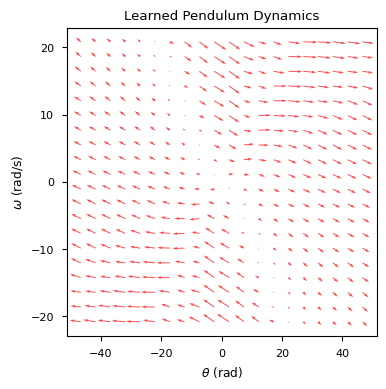

0: 868.8638467425819
1: 865.9756594057473
2: 861.174636293429
3: 852.7055595182535
4: 850.7450132317695
5: 837.8319341839477
6: 835.7703121021782
7: 823.8973189573189
8: 824.7741025573357
9: 815.8291438211439
10: 802.566158974822
11: 804.2528719268183
12: 795.7429029405273
13: 796.0110988996398
14: 787.7043035255139
15: 783.8995905846724
16: 777.5360451991958
17: 766.9843891904975
18: 765.9513741452226
19: 761.3809694390427
20: 756.7417092445089
21: 741.9711623916268
22: 747.804751191926
23: 743.1900270711383
24: 736.7655421150888
25: 732.5534622884479
26: 719.9072658088356
27: 721.615821603547
28: 717.5906147386409
29: 712.271272078066
30: 700.3859016943118
31: 703.3643624977183
32: 688.3379331487392
33: 694.9591069465032
34: 687.3138198259496
35: 684.116482188849
36: 675.2154027722539
37: 674.7396965889557
38: 669.5167533612979
39: 664.0150366393568
40: 662.5678250160929
41: 655.2649288312145
42: 653.424552625763
43: 646.8484140196317
44: 642.0276859765331
45: 642.0969018499216
46: 6

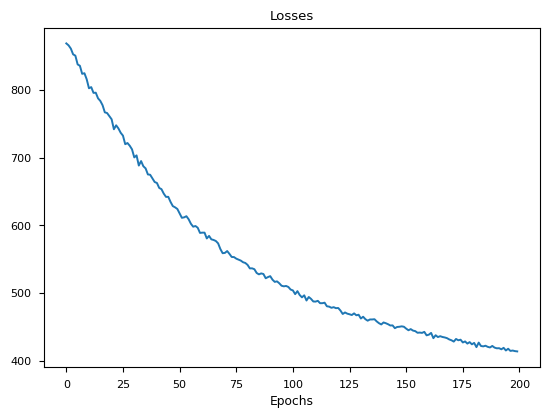

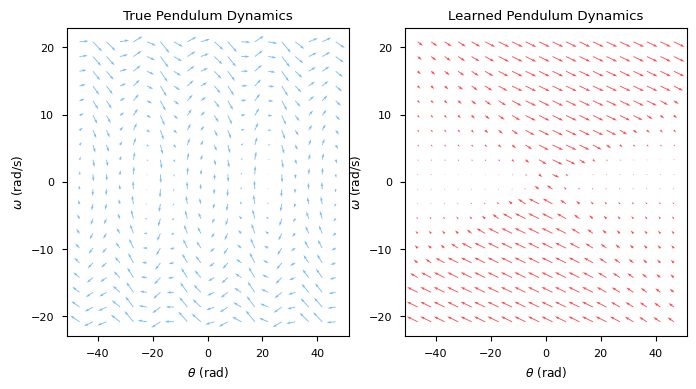


(128, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d', True)



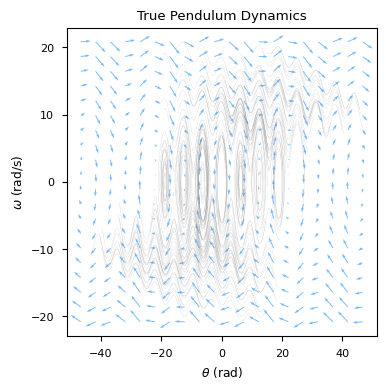

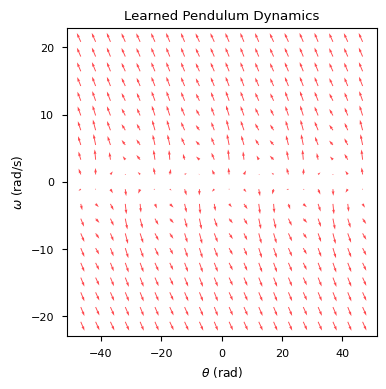

0: 964.4072802138885
1: 960.5529104871011
2: 954.444381566173
3: 943.494988292711
4: 940.7441942164568
5: 925.1529195799149
6: 922.6501008715197
7: 907.0753070797085
8: 907.4093476595083
9: 896.6373264532992
10: 880.5256054941653
11: 881.8737071748194
12: 870.5776210947859
13: 869.0724058626265
14: 858.3646344366168
15: 852.7025101304519
16: 843.7491083626065
17: 830.8078868792039
18: 827.7177549704693
19: 820.9789956700861
20: 814.6616990570853
21: 796.7489998148667
22: 800.7894030654727
23: 794.1101154852549
24: 785.1118086798274
25: 778.2718521487764
26: 762.7569165962922
27: 763.1025720782754
28: 756.5350020924986
29: 748.540514872048
30: 734.449917050779
31: 735.6052683683495
32: 717.9997307639708
33: 723.4091513338511
34: 713.6376066433152
35: 709.0159621563299
36: 698.5227225222454
37: 697.178580798026
38: 690.2259202167279
39: 684.319491384229
40: 681.5928907774062
41: 673.5470065187071
42: 670.835610811836
43: 663.6005304126388
44: 658.9807720897915
45: 658.8553157907534
46: 6

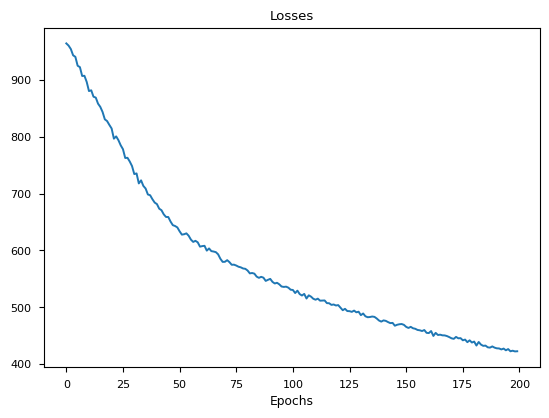

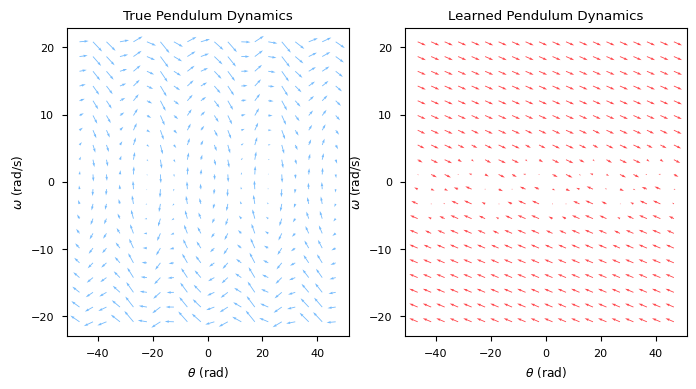


(128, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d', False)



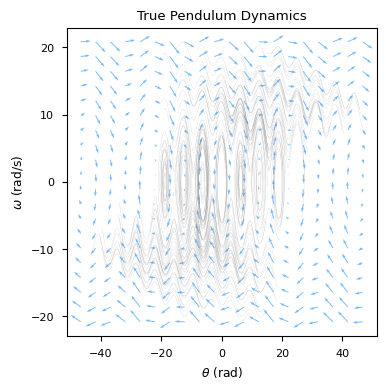

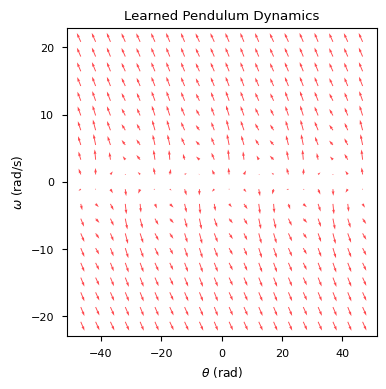

0: 964.4054287722302
1: 960.5273100204905
2: 954.4098396044748
3: 943.4403187334256
4: 940.6556873348152
5: 925.0150508392419
6: 922.496257199366
7: 906.9133990491893
8: 907.1857787543377
9: 896.3827574007813
10: 880.2129230590413
11: 881.4937050446698
12: 870.1561314080566
13: 868.6356506555121
14: 857.8313031443433
15: 852.1332457911724
16: 843.1284654230019
17: 830.1593017588607
18: 826.9786539173684
19: 820.1938111563006
20: 813.8336095724392
21: 795.8731585947444
22: 799.7861429644735
23: 793.0186083410947
24: 783.8911921688778
25: 777.0630323255145
26: 761.4840857309373
27: 761.7391148688059
28: 755.0599661771274
29: 747.0115174102866
30: 732.8515068241641
31: 733.9962988162631
32: 716.1644167309813
33: 721.6872698432285
34: 711.7574123526772
35: 707.0858098696551
36: 696.5249844312286
37: 695.1480361469015
38: 688.1403937369186
39: 682.1049204150811
40: 679.3425335343013
41: 671.2380577115603
42: 668.4208899692835
43: 661.0386292576178
44: 656.5115593213641
45: 656.1753012961683

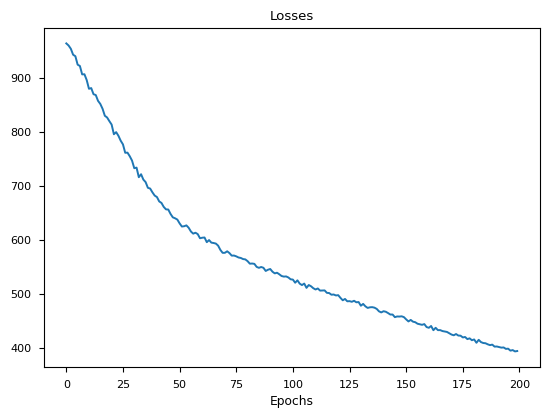

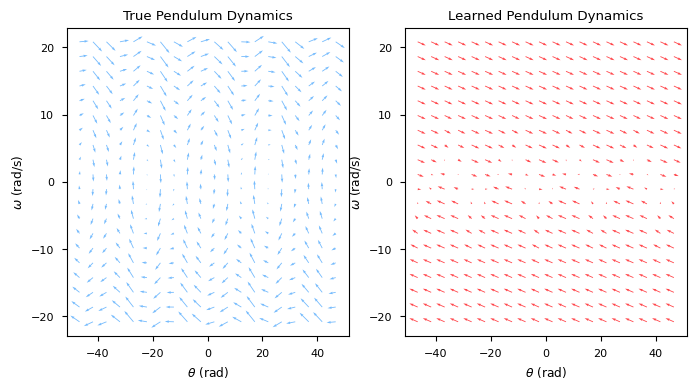


(128, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', True)



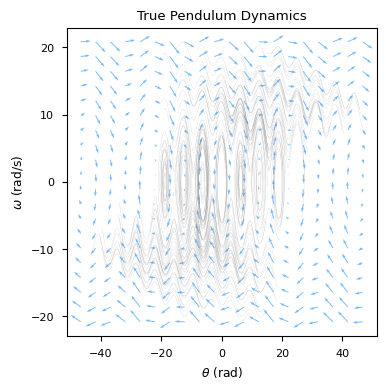

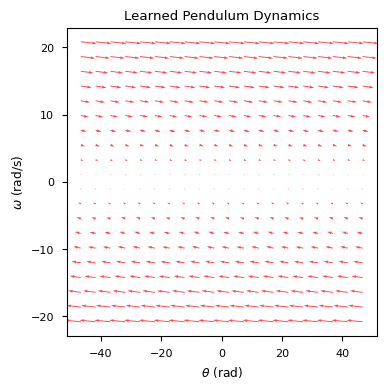

0: 379.0910170784871
1: 376.28550475609467
2: 368.465500247651
3: 356.22260527142555
4: 351.52255315401527
5: 349.15454517871206
6: 342.7850576179514
7: 343.65356433494105
8: 338.151391007498
9: 331.1326216010616
10: 329.59993731884197
11: 327.63025757457297
12: 324.0608795344259
13: 322.2178496586114
14: 318.69220475384117
15: 320.1674357140496
16: 321.80545692238377
17: 318.5920448537458
18: 316.72889487546377
19: 318.3013380550781
20: 315.7181433571534
21: 315.8312777358907
22: 315.1516670593121
23: 315.04555857857525
24: 315.5322556448343
25: 314.9951778905795
26: 315.4343209431968
27: 311.3723255231237
28: 311.5989524667982
29: 315.00225591905166
30: 314.0372666271381
31: 311.34526689612414
32: 312.9823817461098
33: 314.5425911810853
34: 315.09762418010484
35: 315.00283847399027
36: 313.4536957246132
37: 311.70785990153274
38: 315.4958753961354
39: 310.86244256220607
40: 313.85502982374356
41: 313.24648067646956
42: 314.02363380382326
43: 314.6279736304633
44: 311.88074462245623
4

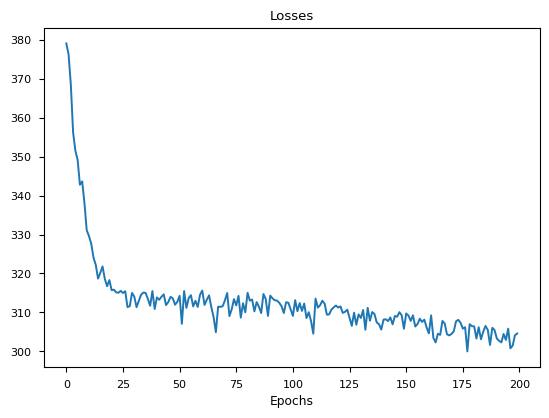

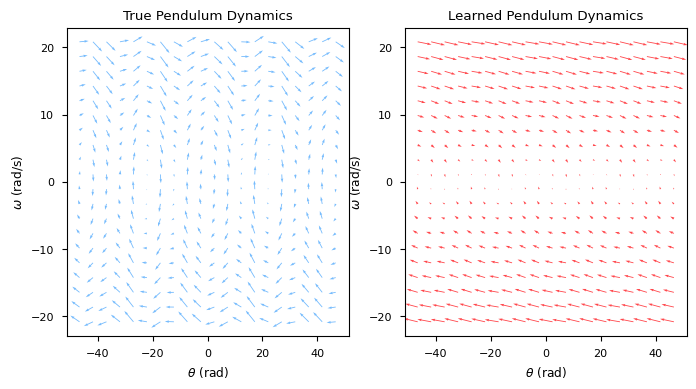


(128, 'tanh', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', False)



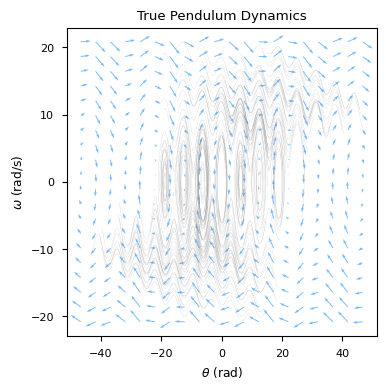

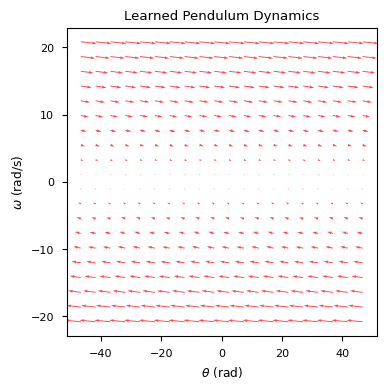

0: 379.08922009149893
1: 376.32946266589244
2: 368.509556161101
3: 356.226512971698
4: 351.4475221699802
5: 348.96504310375315
6: 342.5307904057955
7: 343.26918963104293
8: 337.62585442478945
9: 330.4341269384513
10: 328.8042410178149
11: 326.6089227317442
12: 322.92137554580097
13: 321.0344682675051
14: 317.32352426742386
15: 318.6559925179058
16: 320.1943973657397
17: 316.9497717923871
18: 314.94274090796307
19: 316.4294437805256
20: 313.78811760731736
21: 313.9609014966702
22: 313.1768738283646
23: 312.8456295556269
24: 313.38457825874707
25: 312.91623274013966
26: 313.2141826207708
27: 309.3718852889871
28: 309.1557253616313
29: 312.7909730869128
30: 311.67799141051984
31: 309.34004146626074
32: 310.62965431992916
33: 312.0316097397207
34: 312.5674418579269
35: 312.2979223519033
36: 310.7509982949201
37: 309.4369337082075
38: 312.74034798632727
39: 308.34182363594437
40: 311.16453577478717
41: 310.77046429188056
42: 311.41641682208774
43: 311.72657164506427
44: 309.4604975079558
45

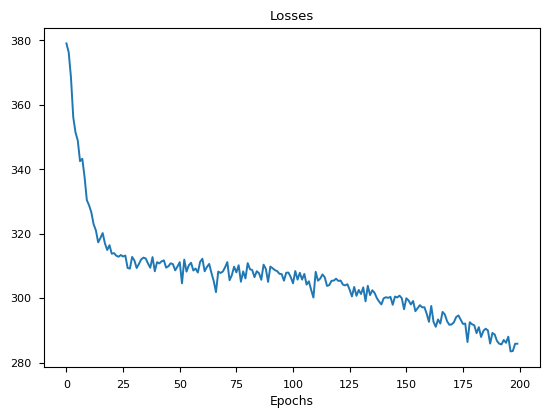

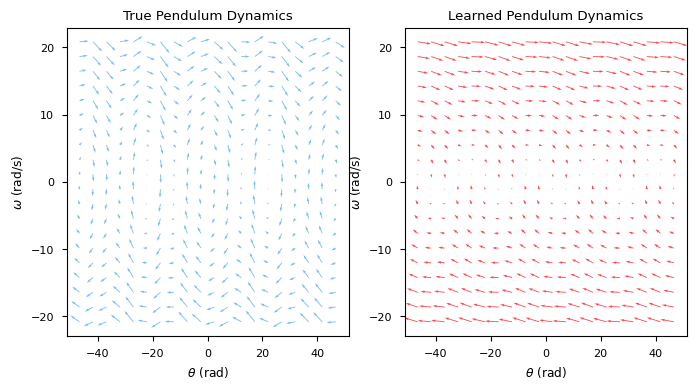


(128, 'relu', 'xavier_norm', 'all_states', 'node', True)



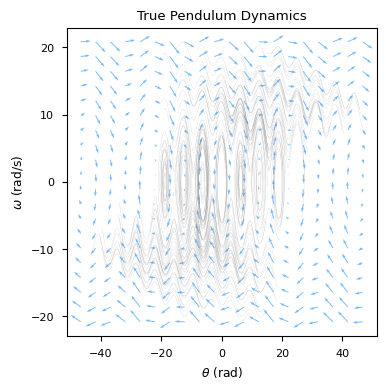

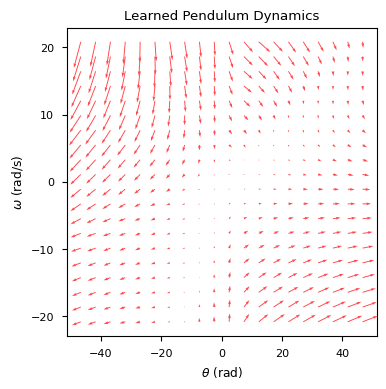

0: 901.9820327982745
1: 893.3404960703609
2: 878.7931359523616
3: 866.8269313176477
4: 859.7642622648091
5: 842.9854583458587
6: 832.8769193297873
7: 813.5727281444183
8: 810.5134464482818
9: 796.7668532144409
10: 778.1113912864691
11: 773.1683483155509
12: 757.9883692044782
13: 751.651205487996
14: 738.1987150394955
15: 727.33889263536
16: 715.7698561011603
17: 699.9825868542935
18: 692.5699939640649
19: 680.705740834914
20: 668.0922361429525
21: 651.7114687750463
22: 646.4008259805771
23: 635.6979302038105
24: 622.6635344183526
25: 611.8740077372514
26: 593.7493347411025
27: 585.7515418088423
28: 574.0134749891088
29: 563.6559084593662
30: 546.6818411181911
31: 537.7144038303383
32: 520.9389007702694
33: 515.1273579923059
34: 501.9106033513603
35: 490.477452494684
36: 476.80431564181424
37: 466.64327955242686
38: 457.05106777091805
39: 443.0220148165349
40: 435.46909600873414
41: 426.30628922292124
42: 419.84957914461563
43: 411.63300238137504
44: 401.59821425454334
45: 396.215690505

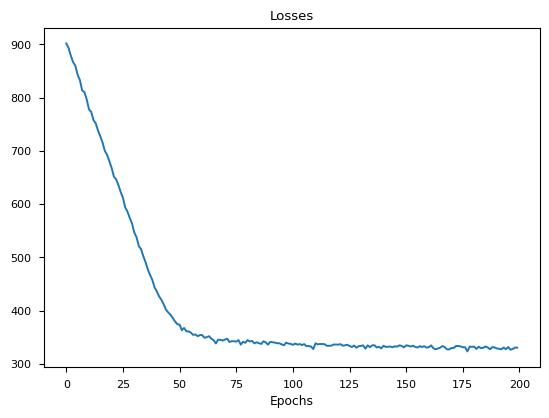

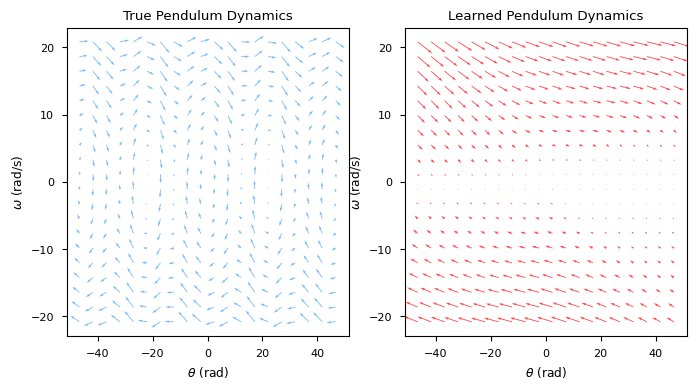


(128, 'relu', 'xavier_norm', 'all_states', 'node', False)



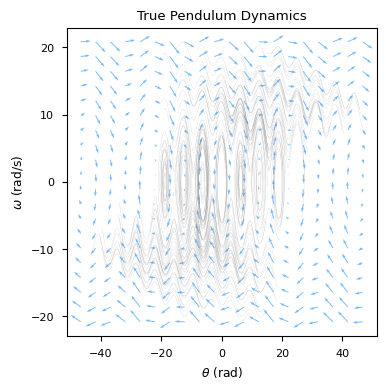

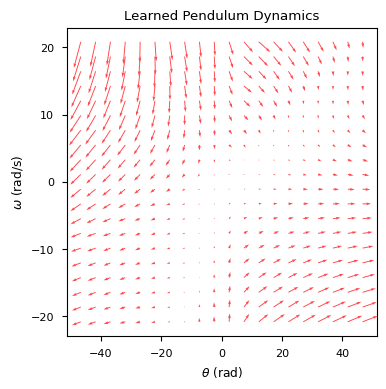

0: 902.0059942927562
1: 893.3669739924088
2: 878.7802943858313
3: 866.8608877773481
4: 859.7600724664353
5: 842.9811454005385
6: 832.8049855230081
7: 813.364542216623
8: 810.2815076797513
9: 796.5584370805801
10: 777.8495769075333
11: 772.8331783234107
12: 757.6860278058458
13: 751.2360180592833
14: 737.7977698250992
15: 726.8768964546198
16: 715.2817418182713
17: 699.4544451326242
18: 692.1098908090464
19: 680.1171342954373
20: 667.4208031853543
21: 651.2169519366983
22: 645.7485648325604
23: 635.3557325931313
24: 622.2530084675774
25: 611.7464117330812
26: 593.0807665531205
27: 585.459943392563
28: 573.4394769863582
29: 563.2304369952025
30: 545.686345280892
31: 537.2207032856733
32: 519.7852405240527
33: 513.9502943591442
34: 500.0047421286954
35: 487.7951986433933
36: 473.78857925885177
37: 463.1344038192249
38: 452.42352595664727
39: 437.1377826214332
40: 428.0360802468334
41: 417.95129341845825
42: 410.1974457433007
43: 400.7767585968269
44: 390.3673512577941
45: 383.585624423241

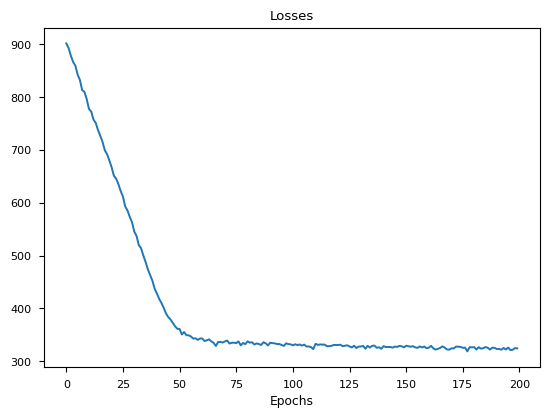

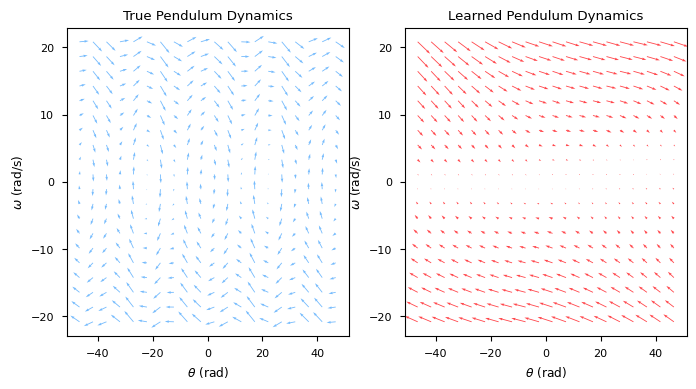


(128, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d', True)



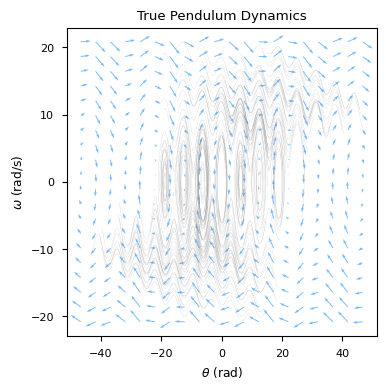

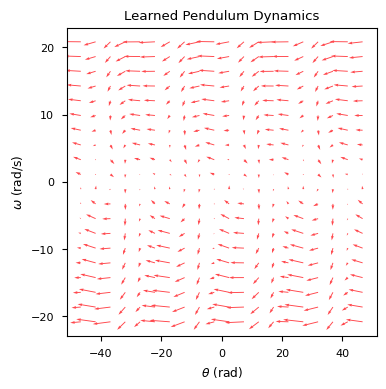

0: 918.7491992836876
1: 909.3537740848942
2: 898.5836620191457
3: 883.9023080429482
4: 874.5851432391067
5: 855.1662626018324
6: 847.1928940708156
7: 828.0311758142478
8: 822.6571549374444
9: 807.5469260427287
10: 789.4605185979914
11: 785.3270096904382
12: 771.8006000820695
13: 766.6877515209294
14: 752.5371104779163
15: 744.3480059821538
16: 733.3392217324747
17: 720.3963283742171
18: 711.960802635093
19: 704.3655755829874
20: 694.885288357071
21: 678.1560470426809
22: 675.8666596995478
23: 666.5616550178686
24: 655.1028716180766
25: 646.0410650633316
26: 632.3816329807148
27: 626.7598098085866
28: 617.4818839127045
29: 608.9567278108891
30: 594.8867784991355
31: 591.297670221295
32: 575.9106646254739
33: 575.0562189341135
34: 564.1538840012712
35: 557.1418950360326
36: 546.1404751600787
37: 540.97370387047
38: 532.4836986055147
39: 521.691504469294
40: 515.2481363901128
41: 507.7757518433407
42: 503.0850813401876
43: 492.6486460107801
44: 485.1758114948704
45: 479.40820694058
46: 47

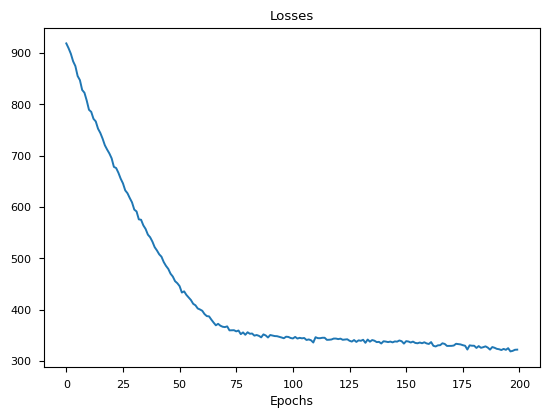

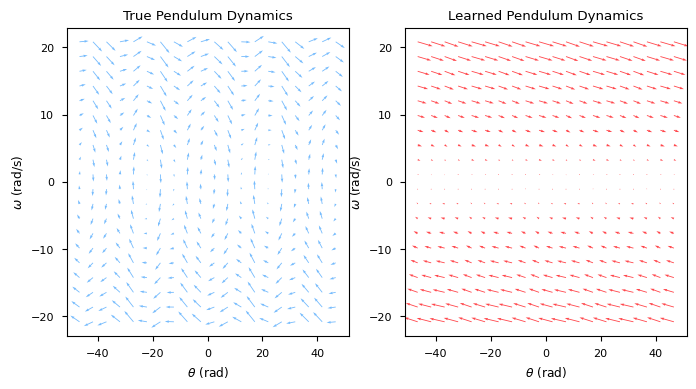


(128, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d', False)



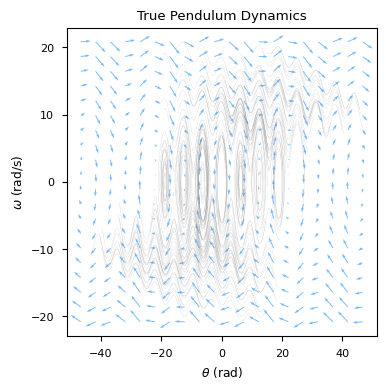

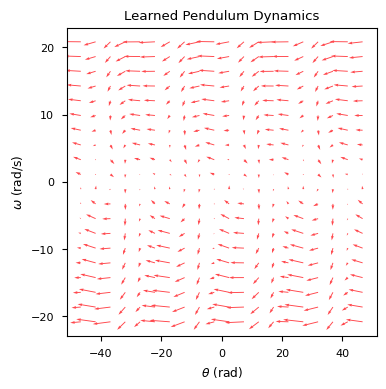

0: 918.7486871788296
1: 909.3192995559432
2: 898.5282124504862
3: 883.813981146697
4: 874.4600713816894
5: 854.9954932103742
6: 847.000657278794
7: 827.7882648340836
8: 822.4409645364908
9: 807.3675329235422
10: 789.1829389221853
11: 784.9736375270782
12: 771.3792432075212
13: 766.167264591295
14: 751.8655015338414
15: 743.4637663385959
16: 732.2561448891825
17: 719.0670620157213
18: 710.444515157712
19: 702.6128212759293
20: 692.9855269041402
21: 676.1252750588661
22: 673.7855469990159
23: 664.2658718079933
24: 652.7270044704435
25: 643.751198420789
26: 629.7257453078009
27: 624.1991627527079
28: 614.7009427316177
29: 606.0721689957124
30: 591.4737734553092
31: 587.9824641279005
32: 571.9228587974171
33: 571.0088253255158
34: 559.6011684794753
35: 552.1833050401194
36: 540.8285189710447
37: 535.613885565187
38: 526.5873497738664
39: 515.5600419938487
40: 508.67551960606664
41: 501.03756216665414
42: 496.081176446142
43: 485.12246600138144
44: 477.7352383492678
45: 471.4549807386745
46

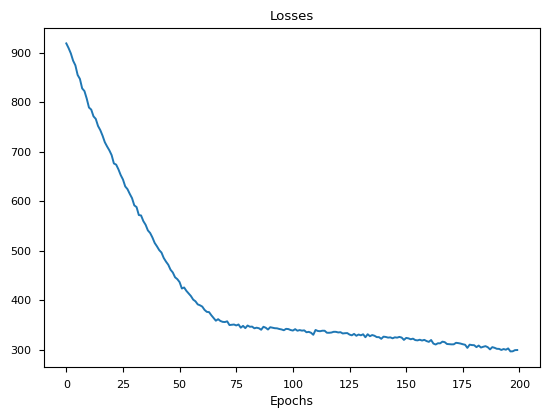

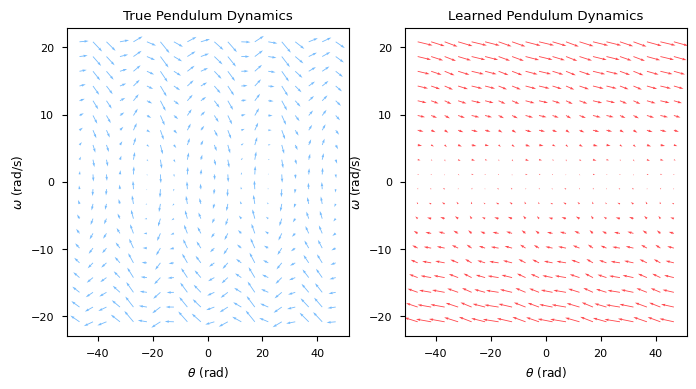


(128, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', True)



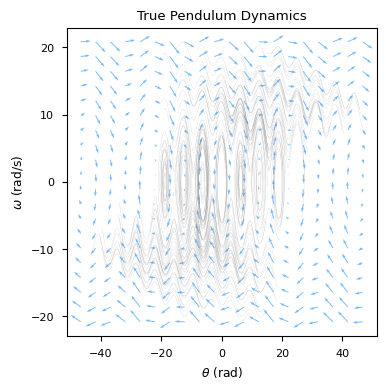

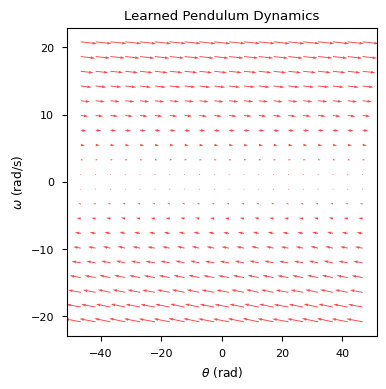

0: 408.1471428556903
1: 404.5160328960562
2: 396.49797446884855
3: 382.78910833460264
4: 377.22519234999135
5: 375.58448207103993
6: 368.7376501002449
7: 370.20380245542617
8: 364.7492839050253
9: 356.3026751292099
10: 356.258800793584
11: 354.2683555207126
12: 351.23602259143786
13: 350.28513169807275
14: 346.79635033050647
15: 348.1520547495413
16: 351.04632516916547
17: 347.9004424823604
18: 347.1759269281539
19: 348.3237113751943
20: 345.6488384669496
21: 346.1480380056274
22: 346.10466485992424
23: 345.53805673728107
24: 346.9664058548435
25: 345.98825493721614
26: 346.68792057621783
27: 341.1648631494878
28: 343.4155272451814
29: 346.46031182305
30: 344.9856337076943
31: 342.0559306766235
32: 344.33397011070235
33: 346.3379274506291
34: 346.7149984917791
35: 346.5917427100819
36: 345.09087579745267
37: 342.3828183693736
38: 346.7738271699792
39: 341.32357597141413
40: 343.9051331102952
41: 342.9035587981324
42: 344.36564153087164
43: 344.7073893114907
44: 340.98803680326034
45: 3

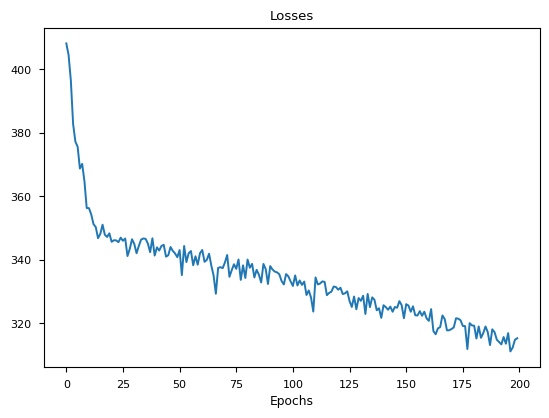

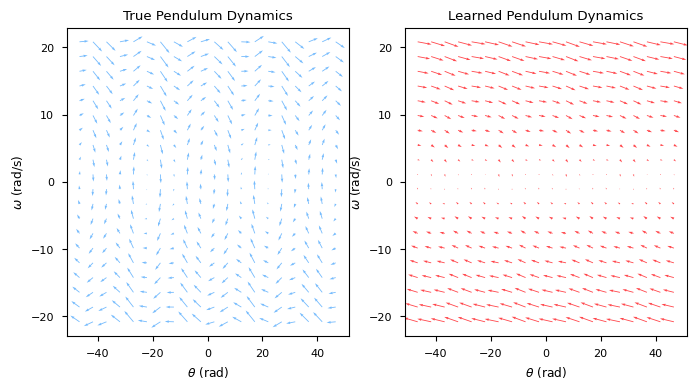


(128, 'relu', 'xavier_norm', 'all_states', 'rotational_encoding_2d_order_2', False)



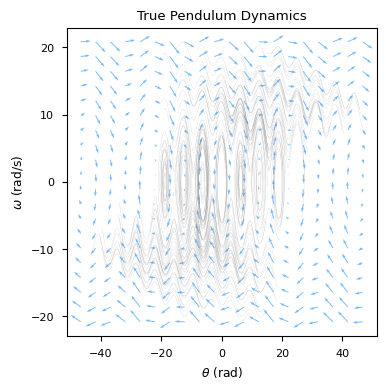

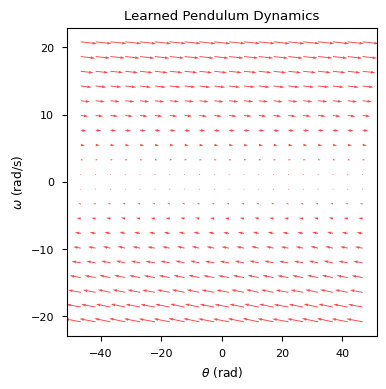

0: 408.14744081763035
1: 404.57613013491107
2: 396.5779896901171
3: 382.84000529819866
4: 377.21742637672634
5: 375.5037823763388
6: 368.59816040247847
7: 369.9766583027762
8: 364.4545057294124
9: 355.9313633561085
10: 355.80178199445925
11: 353.70954643633615
12: 350.6814765438344
13: 349.74007020963666
14: 346.21605034525874
15: 347.49933378086575
16: 350.39694082366026
17: 347.17410949103794
18: 346.4410718957171
19: 347.5180855285954
20: 344.81374069194044
21: 345.2069822430435
22: 345.26880059122846
23: 344.5287325738068
24: 346.0113510946572
25: 345.1542591020697
26: 345.5948962991122
27: 340.3260898681924
28: 342.3887713771859
29: 345.40450174246575
30: 343.71659380508055
31: 340.96129445249085
32: 342.9137609387057
33: 345.03252876594115
34: 345.2847033597822
35: 345.0958678494699
36: 343.52920059986764
37: 340.96820051749125
38: 345.2416242604837
39: 339.81097210479516
40: 342.41337462009756
41: 341.33506858935704
42: 342.79148847617546
43: 343.0306137917083
44: 339.4309784405

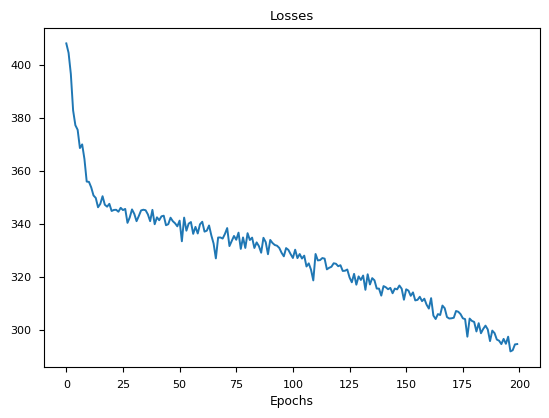

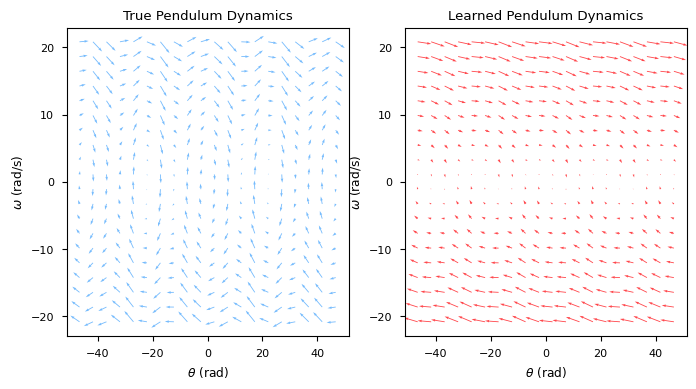

In [26]:
results = {}
for param_set in itertools.product(batch_sizes, activations, initializers.keys(), losses.keys(), models, adjoints):
    print(f"\n{param_set}\n")
    bs, activ, init, loss, model, adjoint = param_set
    tf.random.set_seed(0)
    tf.keras.backend.clear_session()
    gc.collect()
    dxdt = create_model(model, activ, initializers[init])
    duration_s, loss = experiment(dxdt, losses[loss], None, terminal_only_loss, None, None, epochs=epochs, lr=1e-3,
                                  traj_count=traj_count, eval_traj_count=eval_traj_count, solver=solver,
                                  solver_args=solver_args, batch_size=bs, adjoint=adjoint, plot_rate=0)
    results[param_set] = (duration_s, loss)

In [29]:
table = """
| Model | Activation | Initialization | Loss Function | Batch Size | Adjoint | duration (s) | evaluation loss (mse) |
| ----- | ---------- | -------------- | ------------- | ---------- | ------- | ------------ | --------------------- |
"""

best_set = min(results.items(), key=lambda i: i[1][1])[0]

for params, (duration_s, eval_loss) in results.items():
    bs, activ, init, loss, model, adjoint = params
    if params is not best_set:
        table += f"| {model} | {activ} | {init} | {loss} | {bs} | {adjoint} | {duration_s:.2f} | {eval_loss:.2f} |\n"
    else:
        table += f"| {model} | {activ} | {init} | {loss} | {bs} | {adjoint} | {duration_s:.2f} | <b>{eval_loss:.2f}</b> |\n"

display(Markdown(table))


| Model | Activation | Initialization | Loss Function | Batch Size | Adjoint | duration (s) | evaluation loss (mse) |
| ----- | ---------- | -------------- | ------------- | ---------- | ------- | ------------ | --------------------- |
| node | tanh | xavier_norm | all_states | 32 | True | 3587.29 | 4.50 |
| node | tanh | xavier_norm | all_states | 32 | False | 3646.88 | 4.46 |
| rotational_encoding_2d | tanh | xavier_norm | all_states | 32 | True | 3715.45 | 6.83 |
| rotational_encoding_2d | tanh | xavier_norm | all_states | 32 | False | 3750.23 | 4.20 |
| rotational_encoding_2d_order_2 | tanh | xavier_norm | all_states | 32 | True | 3679.83 | 3.10 |
| rotational_encoding_2d_order_2 | tanh | xavier_norm | all_states | 32 | False | 3738.32 | 1.42 |
| node | relu | xavier_norm | all_states | 32 | True | 3591.70 | 4.09 |
| node | relu | xavier_norm | all_states | 32 | False | 3662.15 | 4.13 |
| rotational_encoding_2d | relu | xavier_norm | all_states | 32 | True | 3640.34 | 3.62 |
| rotational_encoding_2d | relu | xavier_norm | all_states | 32 | False | 3739.16 | 3.40 |
| rotational_encoding_2d_order_2 | relu | xavier_norm | all_states | 32 | True | 3663.48 | 3.47 |
| rotational_encoding_2d_order_2 | relu | xavier_norm | all_states | 32 | False | 3752.52 | <b>0.70</b> |
| node | tanh | xavier_norm | all_states | 64 | True | 2096.42 | 5.10 |
| node | tanh | xavier_norm | all_states | 64 | False | 2172.11 | 5.19 |
| rotational_encoding_2d | tanh | xavier_norm | all_states | 64 | True | 2148.10 | 4.84 |
| rotational_encoding_2d | tanh | xavier_norm | all_states | 64 | False | 2183.11 | 4.33 |
| rotational_encoding_2d_order_2 | tanh | xavier_norm | all_states | 64 | True | 2180.02 | 3.61 |
| rotational_encoding_2d_order_2 | tanh | xavier_norm | all_states | 64 | False | 2163.85 | 1.99 |
| node | relu | xavier_norm | all_states | 64 | True | 2086.57 | 4.22 |
| node | relu | xavier_norm | all_states | 64 | False | 2142.77 | 4.25 |
| rotational_encoding_2d | relu | xavier_norm | all_states | 64 | True | 2174.09 | 3.68 |
| rotational_encoding_2d | relu | xavier_norm | all_states | 64 | False | 2183.43 | 3.73 |
| rotational_encoding_2d_order_2 | relu | xavier_norm | all_states | 64 | True | 2124.16 | 3.68 |
| rotational_encoding_2d_order_2 | relu | xavier_norm | all_states | 64 | False | 2260.08 | 3.41 |
| node | tanh | xavier_norm | all_states | 128 | True | 1107.10 | 6.10 |
| node | tanh | xavier_norm | all_states | 128 | False | 1093.16 | 6.23 |
| rotational_encoding_2d | tanh | xavier_norm | all_states | 128 | True | 1104.32 | 6.04 |
| rotational_encoding_2d | tanh | xavier_norm | all_states | 128 | False | 1117.07 | 5.60 |
| rotational_encoding_2d_order_2 | tanh | xavier_norm | all_states | 128 | True | 1115.94 | 3.85 |
| rotational_encoding_2d_order_2 | tanh | xavier_norm | all_states | 128 | False | 1124.56 | 3.74 |
| node | relu | xavier_norm | all_states | 128 | True | 1076.98 | 4.37 |
| node | relu | xavier_norm | all_states | 128 | False | 1094.82 | 4.41 |
| rotational_encoding_2d | relu | xavier_norm | all_states | 128 | True | 1083.65 | 4.05 |
| rotational_encoding_2d | relu | xavier_norm | all_states | 128 | False | 1114.68 | 3.83 |
| rotational_encoding_2d_order_2 | relu | xavier_norm | all_states | 128 | True | 1145.77 | 3.93 |
| rotational_encoding_2d_order_2 | relu | xavier_norm | all_states | 128 | False | 1110.09 | 3.71 |
